In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")
plt.rc('font', family='Times New Roman', size=20)

df = pd.read_excel("H2_delivered_electricity.xlsx")
print(df)

                 Periood                 hour  Electricity  generation  \
0    2022-01-01 00:00:00             00:00:00        2.164         0.0   
1    2022-01-01 01:00:00             01:00:00        2.531         0.0   
2    2022-01-01 02:00:00             02:00:00        2.425         0.0   
3    2022-01-01 03:00:00             03:00:00        1.886         0.0   
4    2022-01-01 04:00:00             04:00:00        1.861         0.0   
...                  ...                  ...          ...         ...   
8755 2022-12-31 19:00:00  1900-12-29 19:00:00        0.852         0.0   
8756 2022-12-31 20:00:00  1900-12-29 20:00:00        0.737         0.0   
8757 2022-12-31 21:00:00  1900-12-29 21:00:00        1.061         0.0   
8758 2022-12-31 22:00:00  1900-12-29 22:00:00        1.763         0.0   
8759 2022-12-31 23:00:00  1900-12-29 23:00:00        2.056         0.0   

      n_generation    h_1    h_2    h_3    h_4    h_5  ...    h_7    h_8  \
0              0.0  0.740  0.185  0

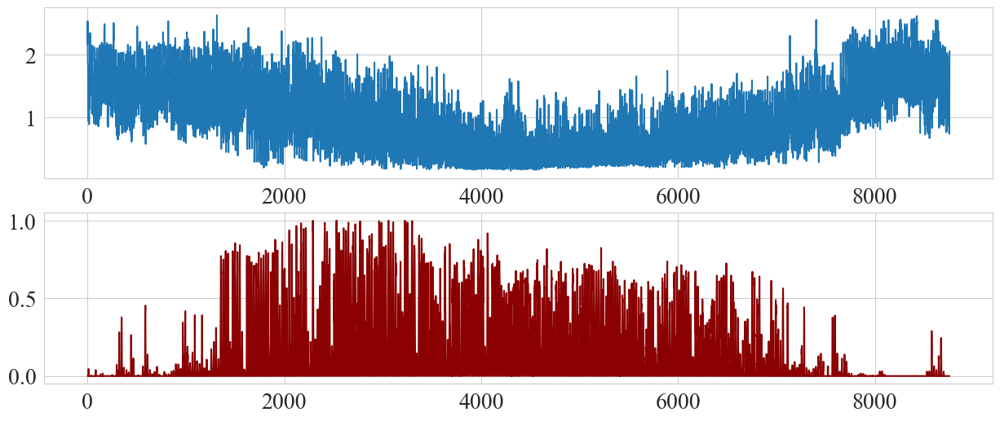

In [48]:
fig, ax = plt.subplots(2,1, figsize=(15,6))
ax[0].plot(df.index,df.Electricity)
ax[1].plot(df.index,df.n_generation, color='darkred')
plt.savefig('H2_plot.svg', dpi=300)
plt.show()

In [49]:
generation  = df.n_generation.sum()
for i in range(1, 16):
    column_name = f'h_{i}'
    sum_consumption = df[column_name].sum()
    pv_size = sum_consumption/generation
    print(f'PV size for {column_name}:', pv_size)

PV size for h_1: 4.717114645401074
PV size for h_2: 2.2458808196741735
PV size for h_3: 2.997869978689286
PV size for h_4: 1.6832983126533043
PV size for h_5: 4.189885757058159
PV size for h_6: 1.3497951045135395
PV size for h_7: 5.662263523889953
PV size for h_8: 6.46266217543983
PV size for h_9: 4.467531503325568
PV size for h_10: 0.7583181325875921
PV size for h_11: 4.207608729588766
PV size for h_12: 4.7309737587922465
PV size for h_13: 2.875161752489798
PV size for h_14: 4.433135309242021
PV size for h_15: 2.2491390177394224


In [50]:
for i in range(1, 16):
    column_name = f'h_{i}'
    max_consumption = df[column_name].max()
    print(f'Converter size for {column_name}:', max_consumption)

Converter size for h_1: 2.955
Converter size for h_2: 2.312
Converter size for h_3: 4.085
Converter size for h_4: 1.301
Converter size for h_5: 3.36
Converter size for h_6: 4.008
Converter size for h_7: 4.24
Converter size for h_8: 4.758
Converter size for h_9: 3.654
Converter size for h_10: 0.705
Converter size for h_11: 6.572
Converter size for h_12: 5.837
Converter size for h_13: 3.113
Converter size for h_14: 3.447
Converter size for h_15: 2.152


In [51]:
sum_generation = df.n_generation.sum()
print(sum_generation*7.5)

difference = df.n_generation * 7.5 - df.Electricity 

positive_diff = difference.copy()
negative_diff = difference.copy()

positive_diff[positive_diff < 0] = np.nan  # Replace negative values with NaN in the positive series
negative_diff[negative_diff > 0] = np.nan  # Replace positive values with NaN in the negative series

print(np.sum(positive_diff))
print(np.sum(negative_diff))

8123.3551398541285
6105.2241514936895
-6104.24901163956


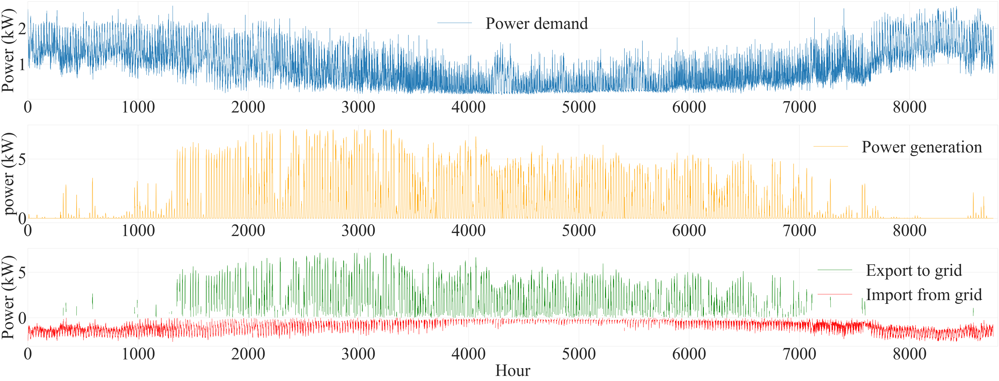

In [52]:
plt.rc('font', family='Times New Roman', size=40)
fig, ax = plt.subplots(3,1, figsize=(60,18))
ax[0].plot(df.index,df.Electricity, label='Load demand')
ax[1].plot(df.index,df.n_generation*7.5, color='orange', label='Generation')
ax[2].plot(df.index, positive_diff, color='green', label = 'export to grid' )# Plot positive differences in green
ax[2].plot(df.index, negative_diff, color='red', label = 'import from grid')  
ax[0].set_ylabel('Power (kW)')
ax[1].set_ylabel('power (kW)')
ax[2].set_ylabel('Power (kW)')
ax[2].set_xlabel('Hour')
ax[0].set_xlim(left=0)
ax[1].set_xlim(left=0)
ax[2].set_xlim(left=0)
ax[0].set_xlim(right=8800)
ax[1].set_xlim(right=8800)
ax[2].set_xlim(right=8800)
ax[0].legend(frameon=False)
ax[1].legend(frameon=False)
ax[2].legend(frameon=False)
plt.savefig('H2_plot.svg', dpi=500)
plt.show()

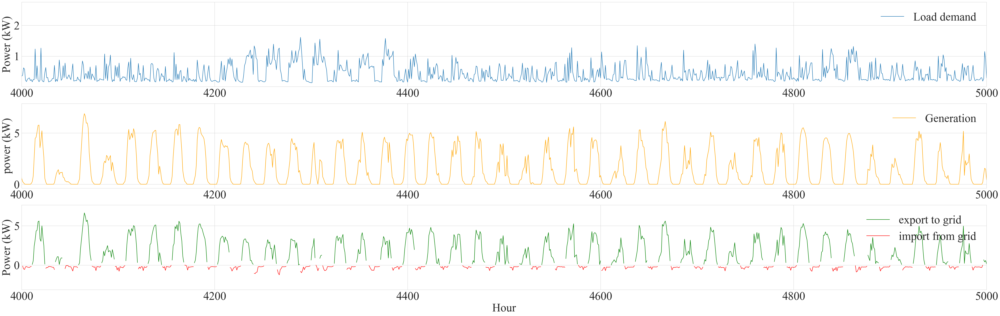

In [53]:
plt.rc('font', family='Times New Roman', size=40)
fig, ax = plt.subplots(3,1, figsize=(60,18))
ax[0].plot(df.index,df.Electricity, label='Load demand')
ax[1].plot(df.index,df.n_generation*7.5, color='orange', label='Generation')
ax[2].plot(df.index, positive_diff, color='green', label = 'export to grid' )# Plot positive differences in green
ax[2].plot(df.index, negative_diff, color='red', label = 'import from grid')  
ax[0].set_ylabel('Power (kW)')
ax[1].set_ylabel('power (kW)')
ax[2].set_ylabel('Power (kW)')
ax[2].set_xlabel('Hour')
ax[0].set_xlim(left=4000)
ax[1].set_xlim(left=4000)
ax[2].set_xlim(left=4000)
ax[0].set_xlim(right=5000)
ax[1].set_xlim(right=5000)
ax[2].set_xlim(right=5000)
ax[0].legend(frameon=False)
ax[1].legend(frameon=False)
ax[2].legend(frameon=False)
plt.savefig('H2_plot_zoom_4000_5000.png', dpi=500)
plt.show()

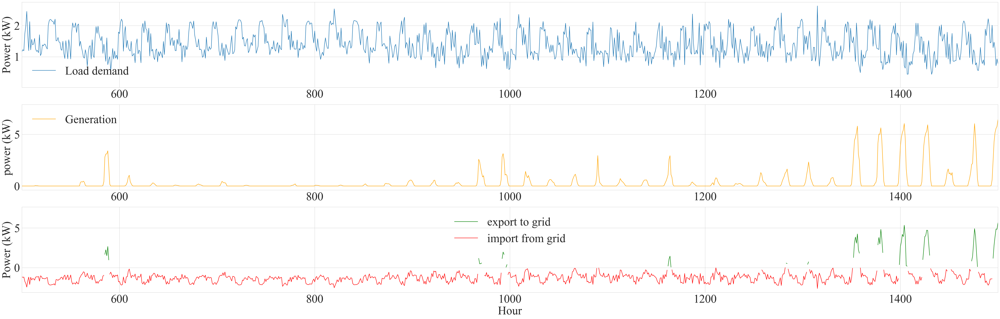

In [54]:
plt.rc('font', family='Times New Roman', size=40)
fig, ax = plt.subplots(3,1, figsize=(60,18))
ax[0].plot(df.index,df.Electricity, label='Load demand')
ax[1].plot(df.index,df.n_generation*7.5, color='orange', label='Generation')
ax[2].plot(df.index, positive_diff, color='green', label = 'export to grid' )# Plot positive differences in green
ax[2].plot(df.index, negative_diff, color='red', label = 'import from grid')  
ax[0].set_ylabel('Power (kW)')
ax[1].set_ylabel('power (kW)')
ax[2].set_ylabel('Power (kW)')
ax[2].set_xlabel('Hour')
ax[0].set_xlim(left=500)
ax[1].set_xlim(left=500)
ax[2].set_xlim(left=500)
ax[0].set_xlim(right=1500)
ax[1].set_xlim(right=1500)
ax[2].set_xlim(right=1500)
ax[0].legend(frameon=False)
ax[1].legend(frameon=False)
ax[2].legend(frameon=False)
plt.savefig('H2_plot_zoom_500_1500.png', dpi=500)
plt.show()

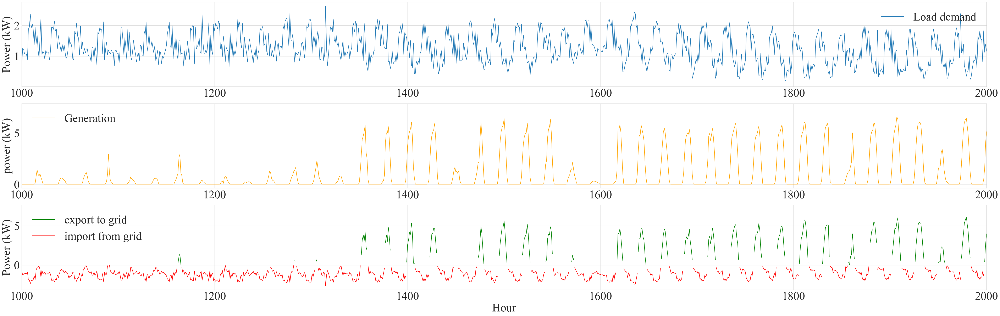

In [55]:
plt.rc('font', family='Times New Roman', size=40)
fig, ax = plt.subplots(3,1, figsize=(60,18))
ax[0].plot(df.index,df.Electricity, label='Load demand')
ax[1].plot(df.index,df.n_generation*7.5, color='orange', label='Generation')
ax[2].plot(df.index, positive_diff, color='green', label = 'export to grid' )# Plot positive differences in green
ax[2].plot(df.index, negative_diff, color='red', label = 'import from grid')  
ax[0].set_ylabel('Power (kW)')
ax[1].set_ylabel('power (kW)')
ax[2].set_ylabel('Power (kW)')
ax[2].set_xlabel('Hour')
ax[0].set_xlim(left=1000)
ax[1].set_xlim(left=1000)
ax[2].set_xlim(left=1000)
ax[0].set_xlim(right=2000)
ax[1].set_xlim(right=2000)
ax[2].set_xlim(right=2000)
ax[0].legend(frameon=False)
ax[1].legend(frameon=False)
ax[2].legend(frameon=False)
plt.savefig('H2_plot_zoom_1000_2000.png', dpi=500)
plt.show()

In [56]:
energy_condition = df.n_generation*7.5 - df.Electricity
battery_condition = np.zeros_like(energy_condition)
battery_condition[1:] =np.cumsum(energy_condition[:-1])

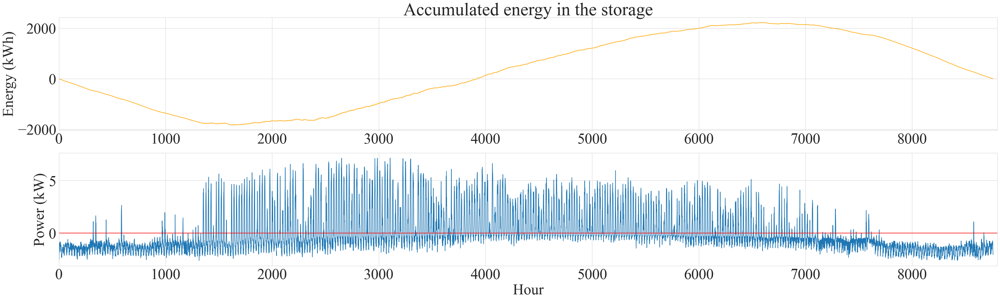

In [57]:
# shows es storage condition if there is no limit in battery capacity.
fig, ax = plt.subplots(2,1, figsize=(45,12))
ax[0].plot(battery_condition, color='orange')
ax[0].set_title('Accumulated energy in the storage')
ax[0].set_ylabel('Energy (kWh)')
ax[1].plot(energy_condition)
ax[1].set_ylabel('Power (kW)')
ax[1].axhline(color='red', alpha=1,linewidth=1.5)
ax[1].set_xlabel('Hour')
ax[0].set_xlim(left=0)
ax[1].set_xlim(left=0)
ax[0].set_xlim(right=8800)
ax[1].set_xlim(right=8800)
plt.savefig('H2_plot_battery.png', dpi=300)
plt.show()

In [58]:
# battery_condition[1:] = np.cumsum(energy_condition[:-1])

In [59]:
df['Electricity'] = df['Electricity'].astype(float).fillna(0)
df['Generation'] = df['n_generation'].astype(float).fillna(0)
df['Generation'] = df['Generation']*7.5
df['Grid'] = 0.0  
df['StoredEnergy'] = 0.0  
ESS_capacity = 20.0  # Energy Storage System capacity in kWh
stored_energy = 0.0  # Current stored energy in the ESS
df['BatterySoC'] = 0.0

for index, row in df.iterrows():
    demand = row['Electricity']
    generation = row['Generation']
    if generation >= demand:
        surplus = generation - demand
        potential_storage = min(surplus, ESS_capacity - stored_energy)
        stored_energy += potential_storage
        df.at[index, 'Grid'] = surplus - potential_storage
    else:
        shortfall = demand - generation
        energy_from_storage = min(shortfall, stored_energy)
        stored_energy -= energy_from_storage
        df.at[index, 'Grid'] =  energy_from_storage - shortfall 
    df.at[index, 'StoredEnergy'] = stored_energy
    battery_soc = (stored_energy / ESS_capacity) * 100  # Calculate SoC as a percentage
    df.at[index, 'BatterySoC'] = battery_soc

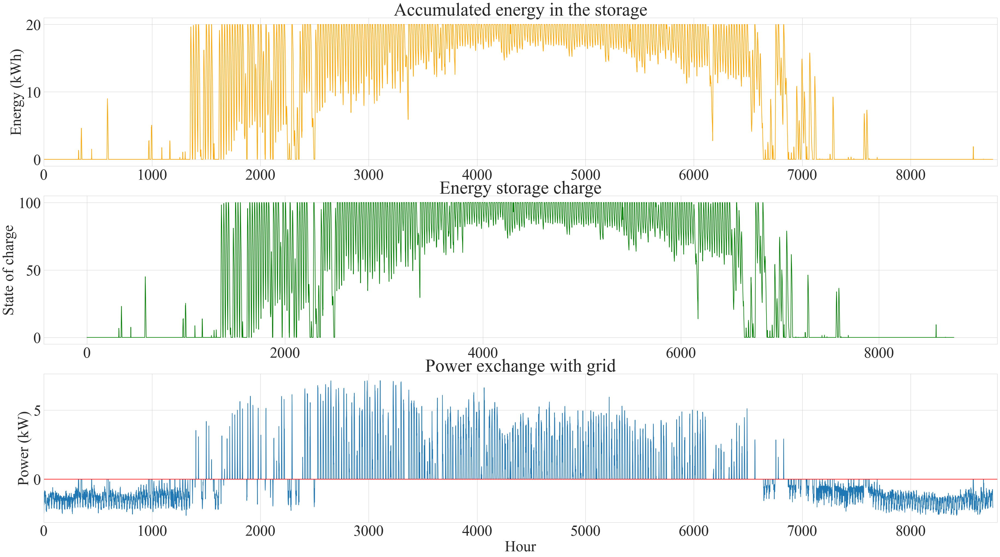

In [60]:
fig, ax = plt.subplots(3,1, figsize=(45,24))
ax[0].plot(df.StoredEnergy, color='orange')
ax[0].set_title('Accumulated energy in the storage')
ax[0].set_ylabel('Energy (kWh)')
ax[1].plot(df.BatterySoC, color= 'green')
ax[1].set_title('Energy storage charge')
ax[1].set_ylabel('State of charge')
ax[2].set_title('Power exchange with grid')
ax[2].plot(df.Grid)
ax[2].set_ylabel('Power (kW)')
ax[2].axhline(color='red', alpha=1,linewidth=1.5)
ax[2].set_xlabel('Hour')
ax[0].set_xlim(left=0)
ax[2].set_xlim(left=0)
ax[0].set_xlim(right=8800)
ax[2].set_xlim(right=8800)
# plt.savefig('H2_plot_battery_grid.png', dpi=300)
plt.show()

In [61]:
total_generation = df['Generation'].sum()
total_imported_energy = df[df['Grid'] < 0]['Grid'].abs().sum() 
total_exported_energy = df[df['Grid'] > 0]['Grid'].sum()  

ESC = (total_generation - total_exported_energy) / total_generation if total_generation > 0 else 0

total_consumption = df['Electricity'].sum()
energy_from_solar_and_storage = total_generation + df[df['Grid'] < 0]['Grid'].abs().sum() 
EA = energy_from_solar_and_storage/ total_consumption if total_consumption > 0 else 0
total_energy_exchanged_with_grid = df['Grid'].abs().sum() 

print(f"total generation: {total_generation:.2f}")
print(f"total exported energy: {total_exported_energy:.2f}")
print(f"total imported energy: {total_imported_energy:.2f}")
print(f"Energy Self-Consumption (ESC): {ESC * 100:.2f}%")
print(f"Energy Autonomy (EA): {EA * 100:.2f}%")
print(f"Total Energy Exchanged with the Grid: {total_energy_exchanged_with_grid} kWh")

total generation: 8123.36
total exported energy: 4168.16
total imported energy: 4167.19
Energy Self-Consumption (ESC): 48.69%
Energy Autonomy (EA): 151.32%
Total Energy Exchanged with the Grid: 8335.3482653662 kWh


In [62]:

df['Electricity'] = df['Electricity'].astype(float).fillna(0)
df['Generation'] = df['n_generation'].astype(float).fillna(0)
df['Generation'] = df['Generation'] * 7.5
results = {}

for ESS_capacity in range(1, 41):  # Loop from 1 kWh to 40 kWh
    df['Grid'] = 0.0
    df['StoredEnergy'] = 0.0
    df['BatterySoC'] = 0.0
    stored_energy = 0.0

    for index, row in df.iterrows():
        demand = row['Electricity']
        generation = row['Generation']
        if generation >= demand:
            surplus = generation - demand
            potential_storage = min(surplus, ESS_capacity - stored_energy)
            stored_energy += potential_storage
            df.at[index, 'Grid'] = surplus - potential_storage
        else:
            shortfall = demand - generation
            energy_from_storage = min(shortfall, stored_energy)
            stored_energy -= energy_from_storage
            df.at[index, 'Grid'] = energy_from_storage - shortfall
        df.at[index, 'StoredEnergy'] = stored_energy
        battery_soc = (stored_energy / ESS_capacity) * 100
        df.at[index, 'BatterySoC'] = battery_soc

    # Calculate metrics for this ESS capacity
    total_generation = df['Generation'].sum()
    energy_exported_to_grid = df[df['Grid'] > 0]['Grid'].sum()
    ESC = (total_generation - energy_exported_to_grid) / total_generation if total_generation > 0 else 0

    total_consumption = df['Electricity'].sum()
    energy_from_solar_and_storage = total_generation + df[df['Grid'] < 0]['Grid'].abs().sum()
    EA = energy_from_solar_and_storage / total_consumption if total_consumption > 0 else 0

    total_energy_exchanged_with_grid = df['Grid'].abs().sum()

    # Store the results for this capacity
    results[ESS_capacity] = {
        'ESC': ESC,
        'EA': EA,
        'Total Energy Exchanged with Grid': total_energy_exchanged_with_grid
    }

for capacity, metrics in results.items():
    print(f"ESS Capacity: {capacity} kWh")
    print(f" - Energy Self-Consumption (ESC): {metrics['ESC'] * 100:.2f}%")
    print(f" - Energy Autonomy (EA): {metrics['EA'] * 100:.2f}%")
    print(f" - Total Energy Exchanged with Grid: {metrics['Total Energy Exchanged with Grid']} kWh")
    print()

ESS Capacity: 1 kWh
 - Energy Self-Consumption (ESC): 28.10%
 - Energy Autonomy (EA): 171.91%
 - Total Energy Exchanged with Grid: 11680.910957209677 kWh

ESS Capacity: 2 kWh
 - Energy Self-Consumption (ESC): 31.11%
 - Energy Autonomy (EA): 168.90%
 - Total Energy Exchanged with Grid: 11191.316554941679 kWh

ESS Capacity: 3 kWh
 - Energy Self-Consumption (ESC): 33.92%
 - Energy Autonomy (EA): 166.09%
 - Total Energy Exchanged with Grid: 10735.574174053521 kWh

ESS Capacity: 4 kWh
 - Energy Self-Consumption (ESC): 36.21%
 - Energy Autonomy (EA): 163.80%
 - Total Energy Exchanged with Grid: 10362.675277742555 kWh

ESS Capacity: 5 kWh
 - Energy Self-Consumption (ESC): 38.13%
 - Energy Autonomy (EA): 161.87%
 - Total Energy Exchanged with Grid: 10050.066344123892 kWh

ESS Capacity: 6 kWh
 - Energy Self-Consumption (ESC): 39.83%
 - Energy Autonomy (EA): 160.17%
 - Total Energy Exchanged with Grid: 9774.21434209651 kWh

ESS Capacity: 7 kWh
 - Energy Self-Consumption (ESC): 41.32%
 - Energy A

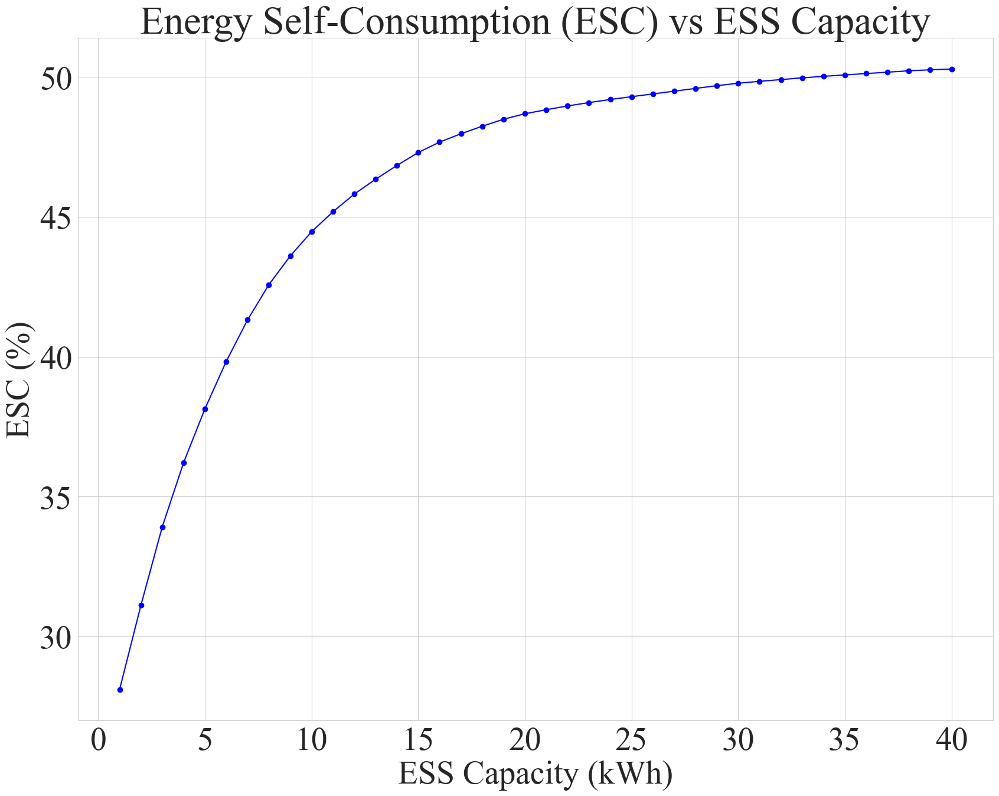

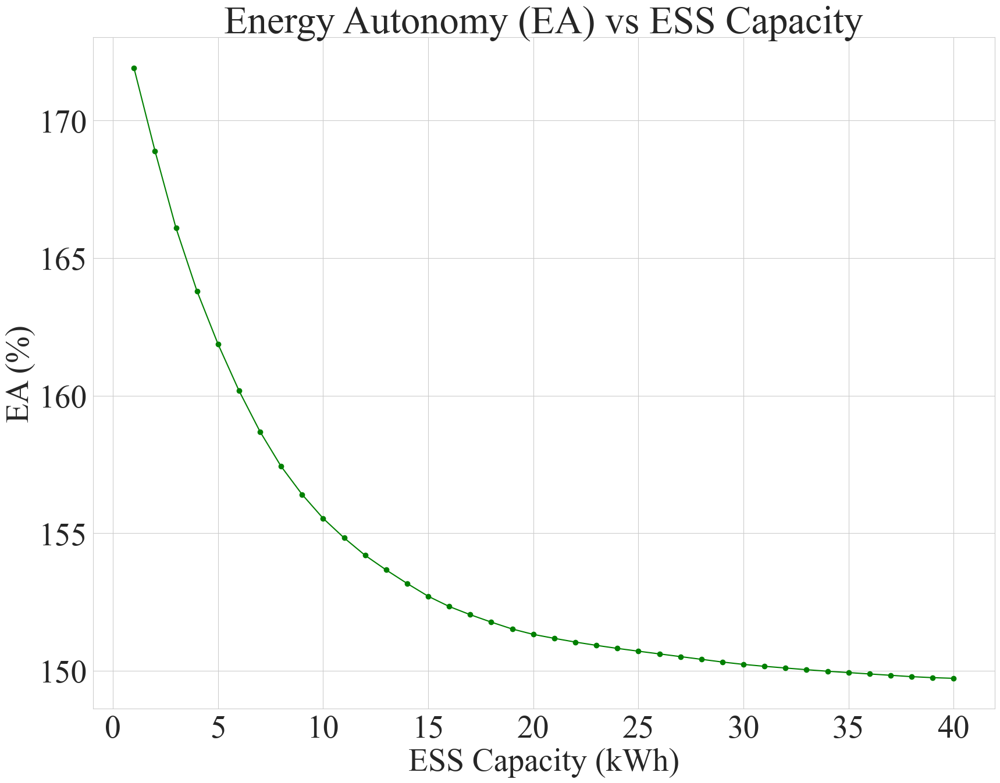

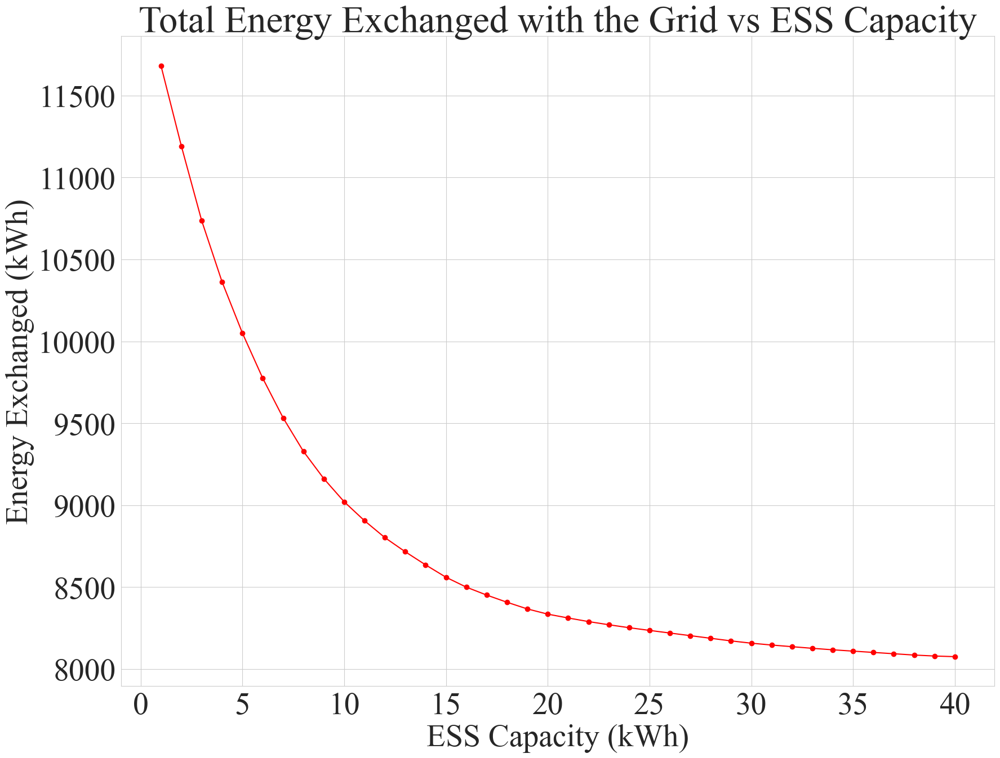

In [63]:
capacities = list(results.keys())
ESC_values = [results[cap]['ESC'] * 100 for cap in capacities]  
EA_values = [results[cap]['EA'] * 100 for cap in capacities] 
grid_exchange_values = [results[cap]['Total Energy Exchanged with Grid'] for cap in capacities]

# Plotting Energy Self-Consumption (ESC)
plt.figure(figsize=(20, 15))
plt.plot(capacities, ESC_values, color='blue', marker='o')
plt.title('Energy Self-Consumption (ESC) vs ESS Capacity')
plt.xlabel('ESS Capacity (kWh)')
plt.ylabel('ESC (%)')
plt.grid(True)
plt.savefig('Energy Self-Consumption.png', dpi =300)
plt.show()

# Plotting Energy Autonomy (EA)
plt.figure(figsize=(20, 15))
plt.plot(capacities, EA_values, color='green', marker='o')
plt.title('Energy Autonomy (EA) vs ESS Capacity')
plt.xlabel('ESS Capacity (kWh)')
plt.ylabel('EA (%)')
plt.grid(True)
plt.savefig('Energy Autonomy.png', dpi =300)
plt.show()

# Plotting Total Energy Exchanged with the Grid
plt.figure(figsize=(20, 15))
plt.plot(capacities, grid_exchange_values, color='red', marker='o')
plt.title('Total Energy Exchanged with the Grid vs ESS Capacity')
plt.xlabel('ESS Capacity (kWh)')
plt.ylabel('Energy Exchanged (kWh)')
plt.savefig('Energy Exchanged.png', dpi =300)
plt.grid(True)
plt.show()

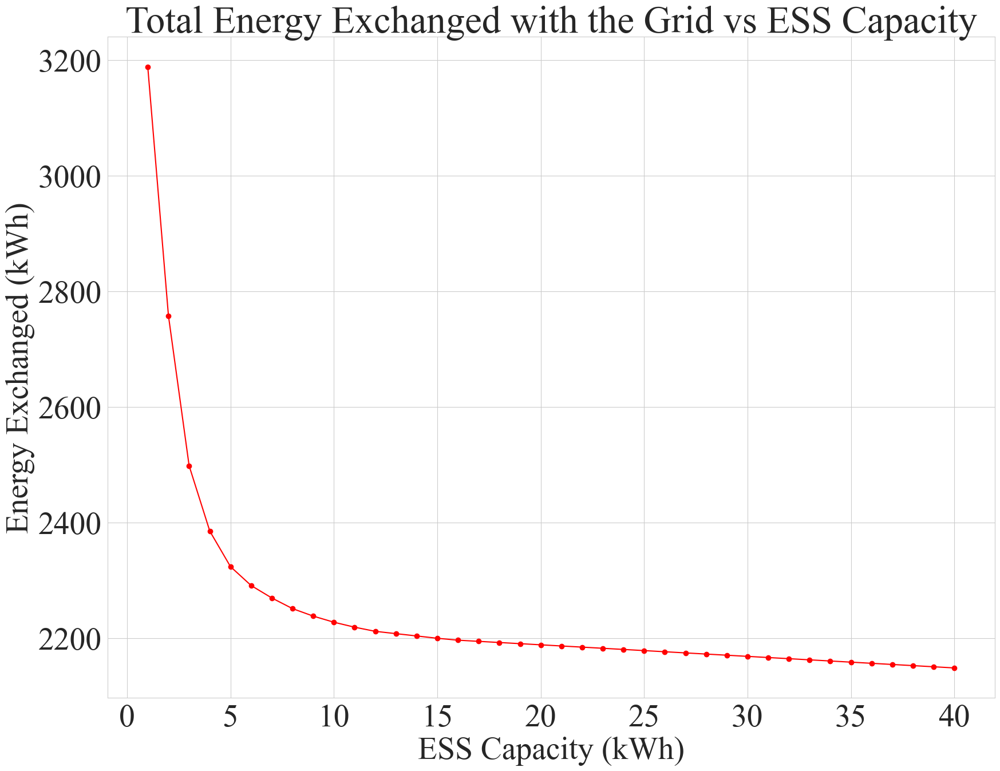

In [64]:
df['Electricity'] = df['h_15'].astype(float).fillna(0)
df['Generation'] = df['n_generation'].astype(float).fillna(0)
df['Generation'] = df['Generation'] * 2.5
results = {}

for ESS_capacity in range(1, 41):  # Loop from 1 kWh to 40 kWh
    df['Grid'] = 0.0
    df['StoredEnergy'] = 0.0
    df['BatterySoC'] = 0.0
    stored_energy = 0.0

    for index, row in df.iterrows():
        demand = row['Electricity']
        generation = row['Generation']
        if generation >= demand:
            surplus = generation - demand
            potential_storage = min(surplus, ESS_capacity - stored_energy)
            stored_energy += potential_storage
            df.at[index, 'Grid'] = surplus - potential_storage
        else:
            shortfall = demand - generation
            energy_from_storage = min(shortfall, stored_energy)
            stored_energy -= energy_from_storage
            df.at[index, 'Grid'] = energy_from_storage - shortfall
        df.at[index, 'StoredEnergy'] = stored_energy
        battery_soc = (stored_energy / ESS_capacity) * 100
        df.at[index, 'BatterySoC'] = battery_soc

    # Calculate metrics for this ESS capacity
    total_generation = df['Generation'].sum()
    energy_exported_to_grid = df[df['Grid'] > 0]['Grid'].sum()
    ESC = (total_generation - energy_exported_to_grid) / total_generation if total_generation > 0 else 0

    total_consumption = df['Electricity'].sum()
    energy_from_solar_and_storage = total_generation + df[df['Grid'] < 0]['Grid'].abs().sum()
    EA = energy_from_solar_and_storage / total_consumption if total_consumption > 0 else 0

    total_energy_exchanged_with_grid = df['Grid'].abs().sum()

    # Store the results for this capacity
    results[ESS_capacity] = {
        'ESC': ESC,
        'EA': EA,
        'Total Energy Exchanged with Grid': total_energy_exchanged_with_grid
    }

# for capacity, metrics in results.items():
#     print(f"ESS Capacity: {capacity} kWh")
#     print(f" - Energy Self-Consumption (ESC): {metrics['ESC'] * 100:.2f}%")
#     print(f" - Energy Autonomy (EA): {metrics['EA'] * 100:.2f}%")
#     print(f" - Total Energy Exchanged with Grid: {metrics['Total Energy Exchanged with Grid']} kWh")
#     print()

capacities = list(results.keys())
ESC_values = [results[cap]['ESC'] * 100 for cap in capacities]
EA_values = [results[cap]['EA'] * 100 for cap in capacities]
grid_exchange_values = [results[cap]['Total Energy Exchanged with Grid'] for cap in capacities]

# Plotting Energy Self-Consumption (ESC)
# plt.figure(figsize=(20, 15))
# plt.plot(capacities, ESC_values, color='blue', marker='o')
# plt.title('Energy Self-Consumption (ESC) vs ESS Capacity')
# plt.xlabel('ESS Capacity (kWh)')
# plt.ylabel('ESC (%)')
# plt.grid(True)
# # plt.savefig('Energy Self-Consumption.png', dpi=300)
# plt.show()

# Plotting Energy Autonomy (EA)
# plt.figure(figsize=(20, 15))
# plt.plot(capacities, EA_values, color='green', marker='o')
# plt.title('Energy Autonomy (EA) vs ESS Capacity')
# plt.xlabel('ESS Capacity (kWh)')
# plt.ylabel('EA (%)')
# plt.grid(True)
# # plt.savefig('Energy Autonomy.png', dpi=300)
# plt.show()

# Plotting Total Energy Exchanged with the Grid
plt.figure(figsize=(20, 15))
plt.plot(capacities, grid_exchange_values, color='red', marker='o')
plt.title('Total Energy Exchanged with the Grid vs ESS Capacity')
plt.xlabel('ESS Capacity (kWh)')
plt.ylabel('Energy Exchanged (kWh)')
# plt.annotate('Intersection Point', xy=(5, 760), xytext=(5+5, 760), arrowprops=dict(facecolor='black', shrink=0.05))
# plt.savefig('Energy Exchanged.png', dpi=300)
plt.grid(True)
plt.show()

In [65]:
# converters efficiency lookup tables for 10% t0 100% of capacity
pv_dc_dc = [96, 97.9, 98.08, 98.2, 98.33, 98.27, 98.0, 97.78, 97.69, 97.6]  # Tala
pv_dc_ac = [91.0, 92.29, 93.48, 94.83, 95.94, 96.77, 97.3, 97.4, 96.2, 95.0] # Fronius IG TL 3.0
es_dc_dc = [91.0, 93.56, 95.11, 96.83, 97.28, 97.72, 98.17, 98.43, 98.17, 97.9]  # Vadim
es_dc_ac = [96.4, 97.13, 97.27, 97.63, 97.54, 97.39, 97.17, 96.97, 96.83, 96.7]  # Tala
iso_ac_dc = [91.1, 94.08, 96.06, 96.43, 96.61, 96.68, 96.63, 96.59, 96.54, 96.5]  # Edivan
load_dc_dc = [88.0, 90.22, 93.44, 96.0, 97.33, 98.00, 96.52, 94.44, 92.22, 90.0]  # SMPS (dc/dc)
load_ac_dc = [85.0, 87.22, 89.44, 91.67, 93.89, 93.89, 91.67, 89.44, 87.22, 85.0]  # SMPS (ac/dc)

In [66]:
# calculating pv loss in ac and dc bus

pv_size_tbl = [0, 5,2.5,3,2,4.5,1.5,6,6.5,4.5,1,4.5,5,3,4.5,2.5,7.5]

for house in range(1, 17):
    df['Generation'] = df['n_generation'].astype(float).fillna(0)
    df['Generation'] = df['Generation'] * pv_size_tbl[house]
    max_generation = df['Generation'].max()

    for group in range(1, 11):
        threshold = group * 0.10 * max_generation
        group_name = f'{group}'
        df.loc[df['Generation'] <= threshold, 'Category'] = group_name

    df['ac_Efficiency'] = df['Category'].apply(lambda x: pv_dc_ac[int(x)-1])
    df['dc_Efficiency'] = df['Category'].apply(lambda x: pv_dc_dc[int(x)-1])
    df[f'pv_conv_ac_nZEB_{house}'] = df['Generation'] * (1 - df['ac_Efficiency'] / 100)
    df[f'pv_conv_dc_nZEB_{house}'] = df['Generation'] * (1 - df['dc_Efficiency'] / 100)

for house in range(1,17):
    print(f'pv converter loss in ac house_{house}:',df[f'pv_conv_ac_nZEB_{house}'].sum())
    print(f'pv converter loss in dc house_{house}:',df[f'pv_conv_dc_nZEB_{house}'].sum())

pv converter loss in ac house_1: 270.77850466180456
pv converter loss in dc house_1: 129.9736822376662
pv converter loss in ac house_2: 135.38925233090228
pv converter loss in dc house_2: 64.9868411188331
pv converter loss in ac house_3: 162.46710279708276
pv converter loss in dc house_3: 77.98420934259973
pv converter loss in ac house_4: 108.31140186472183
pv converter loss in dc house_4: 51.98947289506648
pv converter loss in ac house_5: 243.7006541956241
pv converter loss in dc house_5: 116.97631401389958
pv converter loss in ac house_6: 81.23355139854138
pv converter loss in dc house_6: 38.99210467129986
pv converter loss in ac house_7: 324.9342055941655
pv converter loss in dc house_7: 155.96841868519945
pv converter loss in ac house_8: 352.01205606034597
pv converter loss in dc house_8: 168.96578690896607
pv converter loss in ac house_9: 243.7006541956241
pv converter loss in dc house_9: 116.97631401389958
pv converter loss in ac house_10: 54.155700932360915
pv converter loss in 

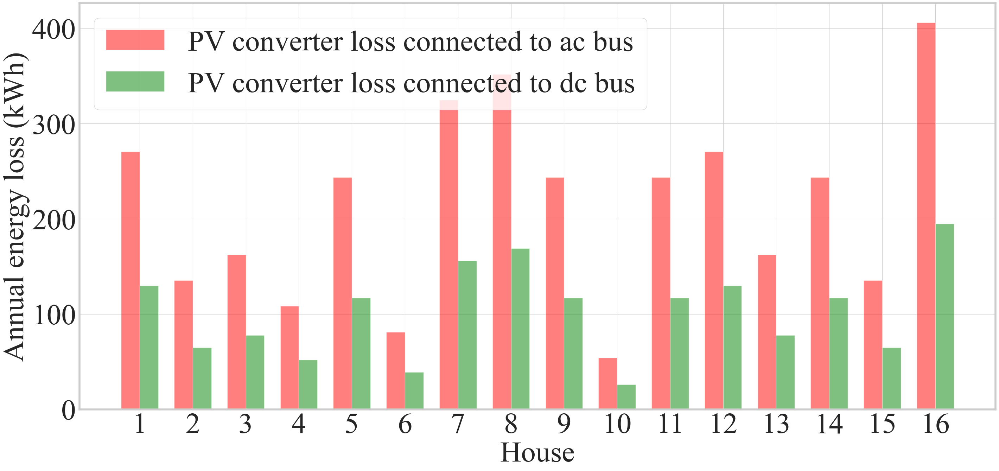

In [76]:
# pv loss in ac and dc bus plot

num_houses = 16

ac_losses = [df[f'pv_conv_ac_nZEB_{i+1}'].sum() for i in range(num_houses)]
dc_losses = [df[f'pv_conv_dc_nZEB_{i+1}'].sum() for i in range(num_houses)]

x = np.arange(num_houses)  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=(30, 15))
rects1 = ax.bar(x - width/2, ac_losses, width, label='PV converter loss connected to ac bus', alpha=0.5, color= 'red')
rects2 = ax.bar(x + width/2, dc_losses, width, label='PV converter loss connected to dc bus',  alpha=0.5, color= 'green')

ax.set_ylabel('Annual energy loss (kWh)', fontsize=50)
ax.set_xlabel('House', fontsize=50)
ax.set_xticks(x)

ax.set_xticklabels([f'{i+1}' for i in range(num_houses)])
ax.legend()

# def autolabel(rects):
#     for rect in rects:
#         height = rect.get_height()
#         ax.annotate('{}'.format(round(height, 2)),
#                     xy=(rect.get_x() + rect.get_width() / 2, height),
#                     xytext=(0, 3),  # 3 points vertical offset
#                     textcoords="offset points",
#                     ha='center', va='bottom')
# 
# autolabel(rects1)
# autolabel(rects2)

ax = plt.gca()  
ax.spines['bottom'].set_linewidth(4)  
ax.spines['left'].set_linewidth(4) 
ax.spines['top'].set_linewidth(4)
ax.spines['right'].set_linewidth(4)
plt.tight_layout()
plt.savefig('pv_loss_comparison.svg', dpi=500)
plt.show()


In [156]:
# ac house

results_ac = {}

for house in range(1, 17):
    
    df['Electricity'] = df[f'h_{house}'].astype(float).fillna(0)     
    df['Generation'] = df['n_generation'].astype(float).fillna(0)
    df['Generation'] = df['Generation'] * pv_size_tbl[house]
    
    
    for ESS_capacity in range(1, 41):  # Loop from 1 kWh to 40 kWh
        df['Grid'] = 0.0
        df['StoredEnergy'] = 0.0
        df['BatterySoC'] = 0.0
        df['ac_ess_loss'] = 0.0
        stored_energy = 0.0
    
        for index, row in df.iterrows():
            demand = row['Electricity']
            generation = row['Generation']
            if generation >= demand:
                surplus = generation - demand
                potential_storage = min(surplus, ESS_capacity - stored_energy)
                stored_energy += (potential_storage * 0.97 * 0.95)  # put look up table later               
                df.at[index,'ac_ess_loss'] = potential_storage * (1 - 0.97 * 0.95) # Energy storage loss in ac mode 
                df.at[index, 'Grid'] = (surplus - potential_storage)
            else:
                shortfall = demand - generation
                energy_from_storage = min(shortfall, stored_energy)
                stored_energy -= energy_from_storage
                df.at[index, 'Grid'] = energy_from_storage - shortfall  # import from grid has negative sign
            df.at[index, 'StoredEnergy'] = stored_energy
            battery_soc = (stored_energy / ESS_capacity) * 100
            df.at[index, 'BatterySoC'] = battery_soc
    
        total_generation = df['Generation'].sum()
        energy_exported_to_grid = df[df['Grid'] > 0]['Grid'].sum()
        ESC = (total_generation - energy_exported_to_grid) / total_generation if total_generation > 0 else 0
    
        total_consumption = df['Electricity'].sum()
        energy_from_solar_and_storage = total_generation + df[df['Grid'] < 0]['Grid'].abs().sum()
        EA = energy_from_solar_and_storage / total_consumption if total_consumption > 0 else 0
    
        total_energy_exchanged_with_grid = df['Grid'].abs().sum()
        total_energy_import_with_grid = df[df['Grid'] < 0]['Grid'].abs().sum()
        total_es_energy_loss = df['ac_ess_loss'].abs().sum()
        # df[f'EEGr_ac_h{house},es{ESS_capacity}']  =  df['Grid'].abs()
    
        results_ac[f'h{house},es{ESS_capacity}'] = {
            'ESC': ESC,
            'EA': EA,
            'Total Energy Exchanged with Grid': total_energy_exchanged_with_grid,
            'Total Energy Import with Grid': total_energy_import_with_grid,
            'Total ES energy loss' : total_es_energy_loss,
        }
    
#     capacities = list(results.keys())
#     ESC_values = [results[cap]['ESC'] * 100 for cap in capacities]
#     EA_values = [results[cap]['EA'] * 100 for cap in capacities]
#     grid_exchange_values = [results[cap]['Total Energy Exchanged with Grid'] for cap in capacities]
#     plt.plot(capacities, grid_exchange_values, marker='o', label=f'House_{i}')

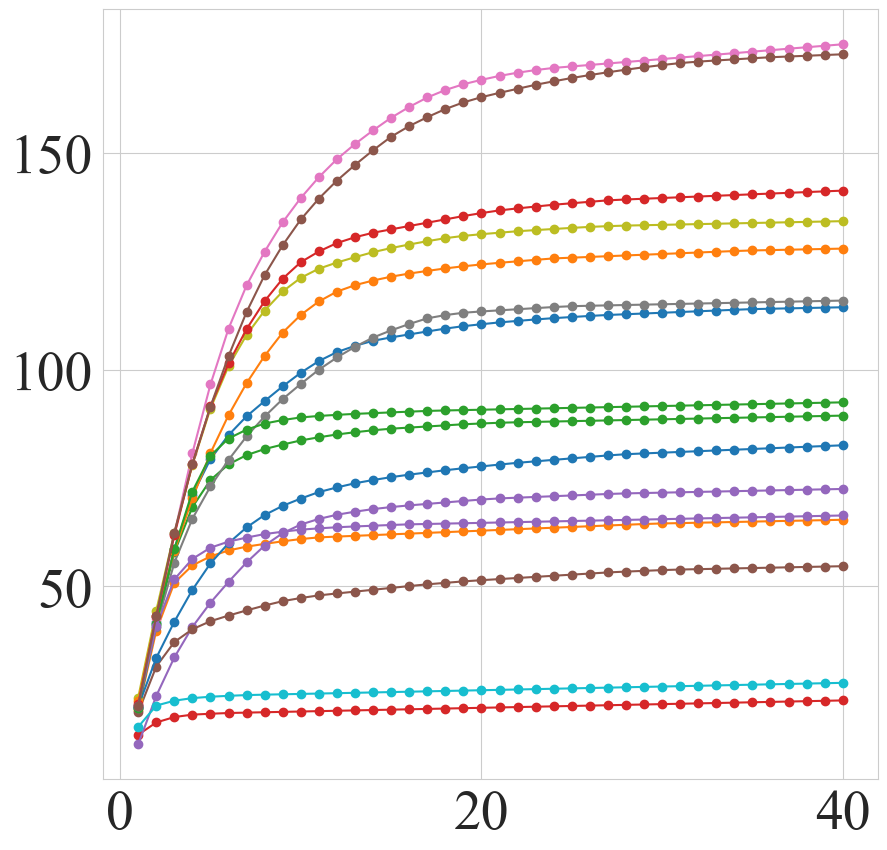

In [69]:
plt.figure(figsize=(10, 10))
es_cap = [*range(1,41)]
for house in range(1, 17): 
    plt.plot(es_cap, [results_ac[f'h{house},es{ess_cap}']['Total ES energy loss']  for ess_cap in es_cap], marker='o', label=f'ac_{house}')
plt.show()

In [144]:
#  ac house with optimum capacities
results_ac = {}
optimum_capacities = [20,11,15,4,17,8,13,16,12,5,13,12,10,12,8,20]

for house in range(1, 17):
    
    df['Electricity'] = df[f'h_{house}'].astype(float).fillna(0)     
    df['Generation'] = df['n_generation'].astype(float).fillna(0)
    df['Generation'] = df['Generation'] * pv_size_tbl[house]
    ESS_capacity = optimum_capacities[house-1]
    
    # for ESS_capacity in range(1, 41):  # Loop from 1 kWh to 40 kWh
    df['Grid'] = 0.0
    df['StoredEnergy'] = 0.0
    df['BatterySoC'] = 0.0
    df['ac_ess_loss'] = 0.0
    stored_energy = 0.0

    for index, row in df.iterrows():
        demand = row['Electricity']
        generation = row['Generation']
        if generation >= demand:
            surplus = generation - demand
            potential_storage = min(surplus, ESS_capacity - stored_energy)
            stored_energy += (potential_storage * 0.97 * 0.95)  # put look up table later               
            df.at[index,'ac_ess_loss'] = potential_storage * (1 - 0.97 * 0.95) # Energy storage loss in ac mode 
            df.at[index, 'Grid'] = (surplus - potential_storage)
        else:
            shortfall = demand - generation
            energy_from_storage = min(shortfall, stored_energy)
            stored_energy -= energy_from_storage
            df.at[index, 'Grid'] = energy_from_storage - shortfall  # import from grid has negative sign
        df.at[index, 'StoredEnergy'] = stored_energy
        battery_soc = (stored_energy / ESS_capacity) * 100
        df.at[index, 'BatterySoC'] = battery_soc

    total_generation = df['Generation'].sum()
    total_pv_loss  = df[f'pv_conv_ac_nZEB_{house}'].sum()
    energy_exported_to_grid = df[df['Grid'] > 0]['Grid'].sum()
    ESC = (total_generation - energy_exported_to_grid) / total_generation if total_generation > 0 else 0

    total_consumption = df['Electricity'].sum()
    energy_from_solar_and_storage = total_generation + df[df['Grid'] < 0]['Grid'].abs().sum()
    EA = energy_from_solar_and_storage / total_consumption if total_consumption > 0 else 0

    total_energy_exchanged_with_grid = df['Grid'].abs().sum()
    total_energy_import_with_grid = df[df['Grid'] < 0]['Grid'].abs().sum()
    total_energy_export_to_grid = df[df['Grid'] > 0]['Grid'].sum()
    total_es_energy_loss = df['ac_ess_loss'].abs().sum()
    # df[f'EEGr_ac_h{house},es{ESS_capacity}']  =  df['Grid'].abs()

    results_ac[f'h{house}'] = {  #,es{ESS_capacity}
        'ESC': ESC,
        'EA': EA,
        'Total Energy Exchanged with Grid': total_energy_exchanged_with_grid,
        'Total Energy Import with Grid': total_energy_import_with_grid,
        'Total Energy Export to Grid': total_energy_export_to_grid,
        'Total ES energy loss' : total_es_energy_loss,
        'Total PV energy loss' : total_pv_loss,
    }
    
#     capacities = list(results.keys())
#     ESC_values = [results[cap]['ESC'] * 100 for cap in capacities]
#     EA_values = [results[cap]['EA'] * 100 for cap in capacities]
#     grid_exchange_values = [results[cap]['Total Energy Exchanged with Grid'] for cap in capacities]
#     plt.plot(capacities, grid_exchange_values, marker='o', label=f'House_{i}')

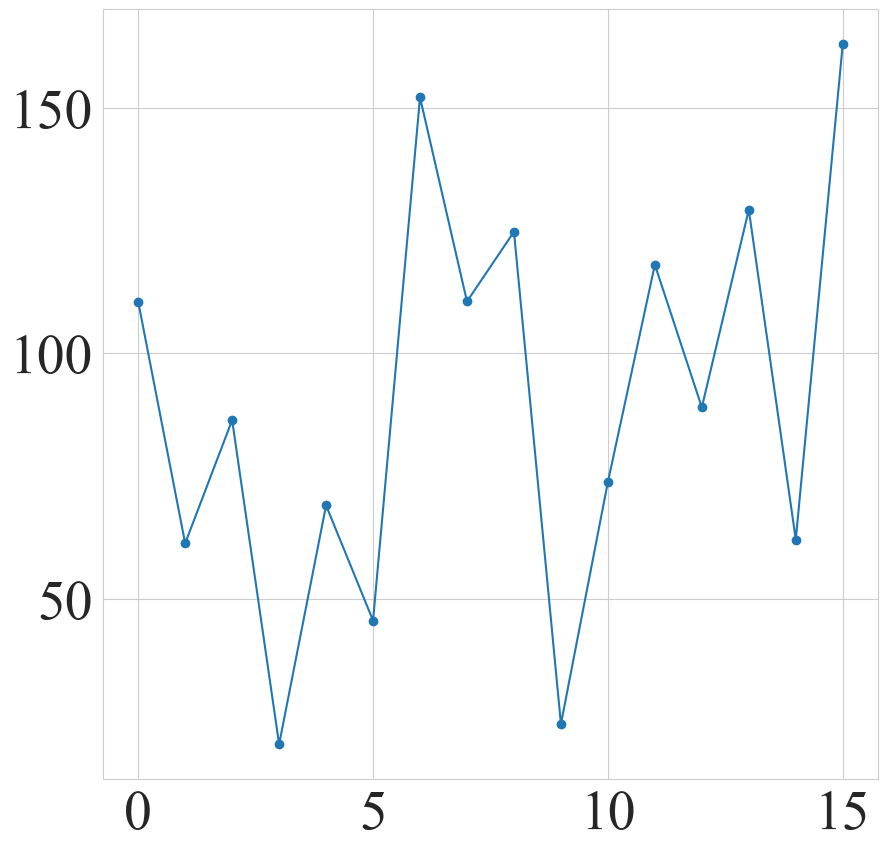

In [71]:
plt.figure(figsize=(10, 10))
es_cap = [*range(0,17)]
# for house in range(1, 17): 
plt.plot([results_ac[f'h{house}']['Total ES energy loss'] for house in range(1,17)], marker='o', label=f'ac_{house}')
plt.show()

In [151]:
# dc house
results_dc = {}

for house in range(1, 17):
    
    df['Electricity'] = df[f'h_{house}'].astype(float).fillna(0)    
    max_load = df['Electricity'].max()
    
    # Considering SMPS efficiency impact on load
    for group in range(1, 11):
        threshold = group * 0.10 * max_load
        df.loc[df['Electricity'] <= threshold, 'load_Category'] = f'{group}'

    df['dc_smps_Efficiency'] = df['load_Category'].apply(lambda x: load_ac_dc[int(x)-1])
    df['Electricity'] = df['Electricity'] * df['dc_smps_Efficiency']/100
    
    # Considering PV dc/dc converter efficiency boost
    df['Generation'] = df['n_generation'].astype(float).fillna(0)
    df['Generation'] = df['Generation'] * pv_size_tbl[house]
    df['Generation'] = df['Generation'] + df[f'pv_conv_ac_nZEB_{house}'] - df[f'pv_conv_dc_nZEB_{house}']
    
    
    for ESS_capacity in range(1, 41):  # Loop from 1 kWh to 40 kWh
        df['grid_dc'] = 0.0
        df['grid_dc_loss']=0.0
        df['dc_storedEnergy'] = 0.0
        df['dc_SoC'] = 0.0
        df['dc_ess_loss'] = 0.0
        stored_energy = 0.0
    
        for index, row in df.iterrows():
            demand = row['Electricity']
            generation = row['Generation']
            if generation >= demand:
                surplus = generation - demand
                potential_storage = min(surplus, ESS_capacity - stored_energy)                
                stored_energy += (potential_storage * 0.95 * 0.99 )
                df.at[index,'dc_ess_loss'] = potential_storage * (1 - 0.95 * 0.99) 
                df.at[index,'grid_dc'] = (surplus - potential_storage) * 0.96   # can be exchanged by lookup table
                # place to calculate interlink converter loss:
                df.at[index,'grid_dc_loss'] = (surplus - potential_storage) * (1 - 0.96) 
            else:
                shortfall = demand - generation
                energy_from_storage = min(shortfall, stored_energy)
                stored_energy -= energy_from_storage
                    
                df.at[index, 'grid_dc'] = (energy_from_storage - shortfall) / 0.96  # negative value
                df.at[index,'grid_dc_loss'] = abs(energy_from_storage - shortfall) * (1 - 0.96) 
            df.at[index, 'dc_storedEnergy'] = stored_energy
            battery_soc = (stored_energy / ESS_capacity) * 100
            df.at[index,'dc_SoC'] = battery_soc
    
        total_generation = df['Generation'].sum()
        energy_exported_to_grid = df[df['grid_dc'] > 0]['grid_dc'].sum()
        ESC = (total_generation - energy_exported_to_grid) / total_generation if total_generation > 0 else 0
    
        total_consumption = df['Electricity'].sum()
        energy_from_solar_and_storage = total_generation+df[df['grid_dc'] < 0]['grid_dc'].abs().sum()
        EA = energy_from_solar_and_storage / total_consumption if total_consumption > 0 else 0
    
        total_energy_exchanged_with_grid = df['grid_dc'].abs().sum()
        total_energy_import_with_grid = df[df['grid_dc'] < 0]['grid_dc'].abs().sum()
        # df[f'EEGr_dc_h{house},es{ESS_capacity}']  =  df['grid_dc'].abs()
        total_energy_exchange_loss = df['grid_dc_loss'].abs().sum()
        total_es_energy_loss = df['dc_ess_loss'].sum()
        
        results_dc[f'h{house},es{ESS_capacity}'] = {
            'ESC': ESC,
            'EA': EA,
            'Total Energy Exchanged with Grid': total_energy_exchanged_with_grid,
            'Total Energy Exchange Loss' : total_energy_exchange_loss,
            'Total Energy Import with Grid': total_energy_import_with_grid,
            'Total ES energy loss' : total_es_energy_loss,
        }

KeyError: 'h1,es1'

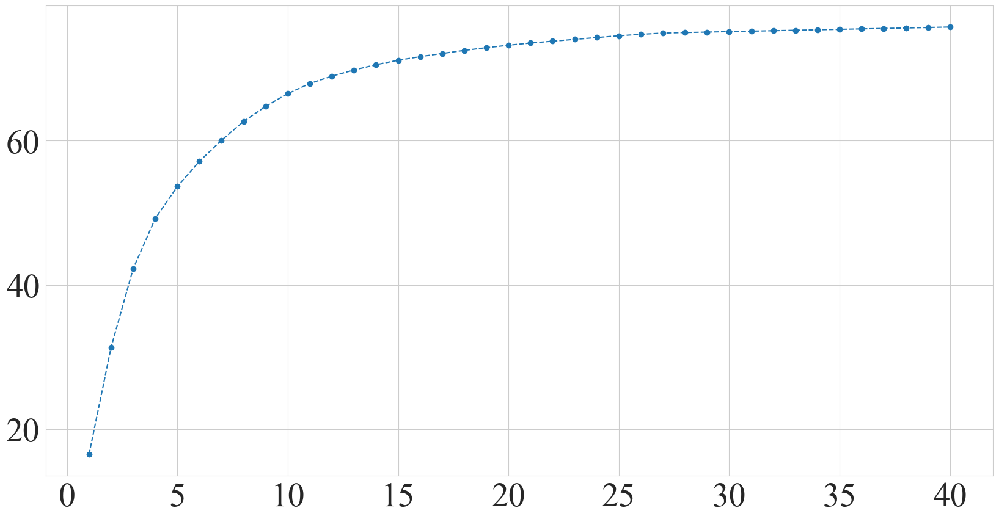

In [73]:
plt.figure(figsize=(20, 10))
es_cap = [*range(1,41)]
for house in range(1, 17): 
    plt.plot(es_cap, [results_dc[f'h{house},es{ess_cap}']['Total ES energy loss']  for ess_cap in es_cap], '--' , marker='o', label=f'dc_{house}')
    plt.plot(es_cap, [results_ac[f'h{house},es{ess_cap}']['Total ES energy loss']  for ess_cap in es_cap], marker='h', label=f'ac_{house}')
# plt.legend()
plt.show()

In [81]:
# dc house with optimum capacities
results_dc = {}

for house in range(1, 17):
    
    df['Electricity'] = df[f'h_{house}'].astype(float).fillna(0)    
    max_load = df['Electricity'].max()
    
    # Considering SMPS efficiency impact on load
    for group in range(1, 11):
        threshold = group * 0.10 * max_load
        df.loc[df['Electricity'] <= threshold, 'load_Category'] = f'{group}'

    df['dc_smps_Efficiency'] = df['load_Category'].apply(lambda x: load_ac_dc[int(x)-1])
    # df['Electricity'] = df['Electricity'] * df['dc_smps_Efficiency']/100
    
    # Considering PV dc/dc converter efficiency boost
    df['Generation'] = df['n_generation'].astype(float).fillna(0)
    df['Generation'] = df['Generation'] * pv_size_tbl[house]
    df['Generation'] = df['Generation'] + df[f'pv_conv_ac_nZEB_{house}'] - df[f'pv_conv_dc_nZEB_{house}']
    
    ESS_capacity = optimum_capacities[house-1]
    df['grid_dc'] = 0.0
    df['grid_dc_loss']=0.0
    df['dc_storedEnergy'] = 0.0
    df['dc_SoC'] = 0.0
    df['dc_ess_loss'] = 0.0
    stored_energy = 0.0

    for index, row in df.iterrows():
        demand = row['Electricity']
        generation = row['Generation']
        if generation >= demand:
            surplus = generation - demand
            potential_storage = min(surplus, ESS_capacity - stored_energy)                
            stored_energy += (potential_storage * 0.95 * 0.99 )
            df.at[index,'dc_ess_loss'] = potential_storage * (1 - 0.95 * 0.99) 
            df.at[index,'grid_dc'] = (surplus - potential_storage) * 0.96   # can be exchanged by lookup table
            # place to calculate interlink converter loss:
            df.at[index,'grid_dc_loss'] = (surplus - potential_storage) * (1 - 0.96) 
        else:
            shortfall = demand - generation
            energy_from_storage = min(shortfall, stored_energy)
            stored_energy -= energy_from_storage
                
            df.at[index, 'grid_dc'] = (energy_from_storage - shortfall) / 0.96  # negative value
            df.at[index,'grid_dc_loss'] = abs(energy_from_storage - shortfall) * (1 - 0.96) 
        df.at[index, 'dc_storedEnergy'] = stored_energy
        battery_soc = (stored_energy / ESS_capacity) * 100
        df.at[index,'dc_SoC'] = battery_soc

    total_generation = df['Generation'].sum()
    energy_exported_to_grid = df[df['grid_dc'] > 0]['grid_dc'].sum()
    ESC = (total_generation - energy_exported_to_grid) / total_generation if total_generation > 0 else 0

    total_consumption = df['Electricity'].sum()
    energy_from_solar_and_storage = total_generation+df[df['grid_dc'] < 0]['grid_dc'].abs().sum()
    EA = energy_from_solar_and_storage / total_consumption if total_consumption > 0 else 0

    total_energy_exchanged_with_grid = df['grid_dc'].abs().sum()
    total_energy_import_with_grid = df[df['grid_dc'] < 0]['grid_dc'].abs().sum()
    total_energy_export_to_grid = df[df['grid_dc'] > 0]['grid_dc'].sum()
    # df[f'EEGr_dc_h{house},es{ESS_capacity}']  =  df['grid_dc'].abs()
    total_energy_exchange_loss = df['grid_dc_loss'].abs().sum()
    total_es_energy_loss = df['dc_ess_loss'].sum()
    
    results_dc[f'h{house}'] = {
        'ESC': ESC,
        'EA': EA,
        'Total Energy Exchanged with Grid': total_energy_exchanged_with_grid,
        'Total Energy Exchange Loss' : total_energy_exchange_loss,
        'Total Energy Import with Grid': total_energy_import_with_grid,
        'Total Energy Export to Grid': total_energy_export_to_grid,
        'Total ES energy loss' : total_es_energy_loss,
    }

In [82]:
# hybrid house
results_hb = {}

for house in range(1, 3):
    
    df['Electricity'] = df[f'h_{house}'].astype(float).fillna(0)    
    # max_load = df['Electricity'].max()
    # 
    # # Considering SMPS efficiency impact on load
    # for group in range(1, 11):
    #     threshold = group * 0.10 * max_load
    #     df.loc[df['Electricity'] <= threshold, 'load_Category'] = f'{group}'
        
           
    # Considering PV dc/dc converter efficiency boost
    df['Generation'] = df['n_generation'].astype(float).fillna(0)
    df['Generation'] = df['Generation'] * pv_size_tbl[house]
    df['Generation'] = df['Generation'] + df[f'pv_conv_ac_nZEB_{house}'] - df[f'pv_conv_dc_nZEB_{house}']
    
    
    for ESS_capacity in range(1, 10):  # Loop from 1 kWh to 40 kWh
        
        df['grid_hb'] = 0.0
        df['hb_link_loss']=0.0
        df['hb_storedEnergy'] = 0.0
        df['hb_SoC'] = 0.0
        df['hb_ess_loss'] = 0.0
        stored_energy = 0.0
    
        for index, row in df.iterrows():
            
            demand = row['Electricity']
            generation = row['Generation']
            
            demand_ac = demand * 0
            demand_dc = demand - demand_ac
          
            if generation >= demand_dc:
                
                # efficiency_smps = load_ac_dc[load_group-1]
                # demand = demand * efficiency_smps/100 
                
                surplus = generation - (demand_dc * 0.90) # smps efficiency
                potential_storage = min(surplus, ESS_capacity - stored_energy)                
                stored_energy += (potential_storage * 0.95 * 0.99 )
                df.at[index,'hb_ess_loss'] = potential_storage * (1 - 0.95 * 0.99) 
                
                if (surplus - potential_storage) * 0.97 >= demand_ac:
                    df.at[index,'grid_hb'] = (surplus - potential_storage) * 0.97 - demand_ac  # export extra pv to grid
                    df.at[index,'hb_link_loss'] = (surplus - potential_storage) * (1 - 0.97)  
                else:
                    demand_ac -= (surplus - potential_storage) * 0.97
                    df.at[index, 'grid_hb'] += -demand_ac
                    df.at[index,'hb_link_loss'] = (surplus - potential_storage) * (1 - 0.97) 
            else:
                shortfall = demand - generation
                energy_from_storage = min(shortfall, stored_energy)
                stored_energy -= energy_from_storage
                df.at[index, 'grid_hb'] = -(shortfall-energy_from_storage)/0.97 - demand_ac
                df.at[index,'hb_link_loss'] = (shortfall-energy_from_storage) * (1 - 0.97)
                
            df.at[index, 'hb_storedEnergy'] = stored_energy
            battery_soc = (stored_energy / ESS_capacity) * 100
            df.at[index,'hb_SoC'] = battery_soc    
    
        total_generation = df['Generation'].sum()
        energy_exported_to_grid = df[df['grid_hb'] > 0]['grid_hb'].sum()
        ESC = (total_generation - energy_exported_to_grid) / total_generation if total_generation > 0 else 0
    
        total_consumption = df['Electricity'].sum()
        energy_from_solar_and_storage = total_generation+df[df['grid_hb'] < 0]['grid_hb'].abs().sum()
        EA = energy_from_solar_and_storage / total_consumption if total_consumption > 0 else 0
    
        total_energy_exchanged_with_grid = df['grid_hb'].abs().sum()
        total_energy_import_with_grid = df[df['grid_hb'] < 0]['grid_hb'].abs().sum()
        # df[f'EEGr_hb_h{house},es{ESS_capacity}']  =  df['grid_hb'].abs()
        total_energy_exchange_loss = df['hb_link_loss'].abs().sum()
        total_es_energy_loss = df['hb_ess_loss'].sum()
        
        results_hb[f'h{house},es{ESS_capacity}'] = {
            'ESC': ESC,
            'EA': EA,
            'Total Energy Exchanged with Grid': total_energy_exchanged_with_grid,
            'Total Energy Loss Between ac dc Bus' : total_energy_exchange_loss,
            'Total Energy Import with Grid': total_energy_import_with_grid,
            'Total ES energy loss' : total_es_energy_loss,
        }

In [83]:
# hybrid house with optimum capacities
results_hb = {}

for house in range(1, 17):
    
    df['Electricity'] = df[f'h_{house}'].astype(float).fillna(0)    
    # max_load = df['Electricity'].max()
    # 
    # # Considering SMPS efficiency impact on load
    # for group in range(1, 11):
    #     threshold = group * 0.10 * max_load
    #     df.loc[df['Electricity'] <= threshold, 'load_Category'] = f'{group}'
        
           
    # Considering PV dc/dc converter efficiency boost
    df['Generation'] = df['n_generation'].astype(float).fillna(0)
    df['Generation'] = df['Generation'] * pv_size_tbl[house]
    df['Generation'] = df['Generation']  + df[f'pv_conv_ac_nZEB_{house}'] - df[f'pv_conv_dc_nZEB_{house}']
    
    ESS_capacity  =optimum_capacities[house-1]   
    df['grid_hb'] = 0.0
    df['hb_link_loss']=0.0
    df['hb_storedEnergy'] = 0.0
    df['hb_SoC'] = 0.0
    df['hb_ess_loss'] = 0.0
    stored_energy = 0.0

    for index, row in df.iterrows():
        
        demand = row['Electricity']
        generation = row['Generation']
        
        demand_ac = demand * .4
        demand_dc = demand - demand_ac
      
        if generation >= demand_dc * 0.90:
            
            # efficiency_smps = load_ac_dc[load_group-1]
            # demand = demand * efficiency_smps/100 
            
            surplus = generation - (demand_dc * 0.90) # smps efficiency
            potential_storage = min(surplus, ESS_capacity - stored_energy)                
            stored_energy += (potential_storage * 0.95 * 0.99 )
            df.at[index,'hb_ess_loss'] = potential_storage * (1 - 0.95 * 0.99) 
            
            if (surplus - potential_storage) * 0.97 >= demand_ac:
                df.at[index,'grid_hb'] = (surplus - potential_storage) * 0.97 - demand_ac  # export extra pv to grid
                df.at[index,'hb_link_loss'] = (surplus - potential_storage) * (1 - 0.97)  
            else:
                demand_ac -= (surplus - potential_storage) * 0.97
                df.at[index, 'grid_hb'] = -demand_ac
                df.at[index,'hb_link_loss'] = (surplus - potential_storage) * (1 - 0.97) 
        else:
            shortfall = demand_dc*0.9 - generation
            energy_from_storage = min(shortfall, stored_energy)
            stored_energy -= energy_from_storage
            df.at[index, 'grid_hb'] = -(shortfall-energy_from_storage)/0.97 - demand_ac
            df.at[index,'hb_link_loss'] = (shortfall-energy_from_storage) * (1 - 0.97)
            
        df.at[index, 'hb_storedEnergy'] = stored_energy
        battery_soc = (stored_energy / ESS_capacity) * 100
        df.at[index,'hb_SoC'] = battery_soc    

    total_generation = df['Generation'].sum()
    energy_exported_to_grid = df[df['grid_hb'] > 0]['grid_hb'].sum()
    ESC = (total_generation - energy_exported_to_grid) / total_generation if total_generation > 0 else 0

    total_consumption = df['Electricity'].sum()
    energy_from_solar_and_storage = total_generation+df[df['grid_hb'] < 0]['grid_hb'].abs().sum()
    EA = energy_from_solar_and_storage / total_consumption if total_consumption > 0 else 0

    total_energy_exchanged_with_grid = df['grid_hb'].abs().sum()
    total_energy_import_with_grid = df[df['grid_hb'] < 0]['grid_hb'].abs().sum()
    total_energy_export_to_grid = df[df['grid_hb'] > 0]['grid_hb'].sum()
    # df[f'EEGr_hb_h{house},es{ESS_capacity}']  =  df['grid_hb'].abs()
    total_energy_exchange_loss = df['hb_link_loss'].abs().sum()
    total_es_energy_loss = df['hb_ess_loss'].sum()
    total_pv_conv_loss = df[f'pv_conv_dc_nZEB_{house}'].sum()
    
    results_hb[f'h{house}'] = {
        'ESC': ESC,
        'EA': EA,
        'Total Energy Exchanged with Grid': total_energy_exchanged_with_grid,
        'Total Energy Loss Between ac dc Bus' : total_energy_exchange_loss,
        'Total Energy Import with Grid': total_energy_import_with_grid,
        'Total Energy Export to Grid': total_energy_export_to_grid,
        'Total ES energy loss' : total_es_energy_loss,
        'Total electricity consumption normal': total_consumption,
        'Total pv conv loss': total_pv_conv_loss,
    }

In [ ]:
plt.figure(figsize=(20, 20))
es_cap = [*range(1,41)]
for house in range(1, 17): 
    # plt.plot(es_cap, [results_hb[f'h{house},es{ess_cap}']['Total Energy Import with Grid']  for ess_cap in es_cap], '--', marker='o', label=f'hb_{house}')
    # plt.plot(es_cap, [results_ac[f'h{house},es{ess_cap}']['Total Energy Import with Grid']  for ess_cap in es_cap],marker='h', label=f'ac_{house}')
    # plt.plot(es_cap, [results_dc[f'h{house},es{ess_cap}']['Total Energy Import with Grid']  for ess_cap in es_cap], ':' , marker='p', label=f'dc_{house}')
    plt.plot(es_cap, [results_hb[f'h{house},es{ess_cap}']['Total Energy Exchanged with Grid']  for ess_cap in es_cap], '--', marker='o', label=f'hb_{house}')
    # plt.plot(es_cap, [results_ac[f'h{house},es{ess_cap}']['Total Energy Exchanged with Grid']  for ess_cap in es_cap],marker='h', label=f'ac_{house}')
    plt.plot(es_cap, [results_dc[f'h{house},es{ess_cap}']['Total Energy Exchanged with Grid']  for ess_cap in es_cap], ':' , marker='p', label=f'dc_{house}')
plt.legend(ncol=8, fontsize=20, frameon=False)
plt.show()

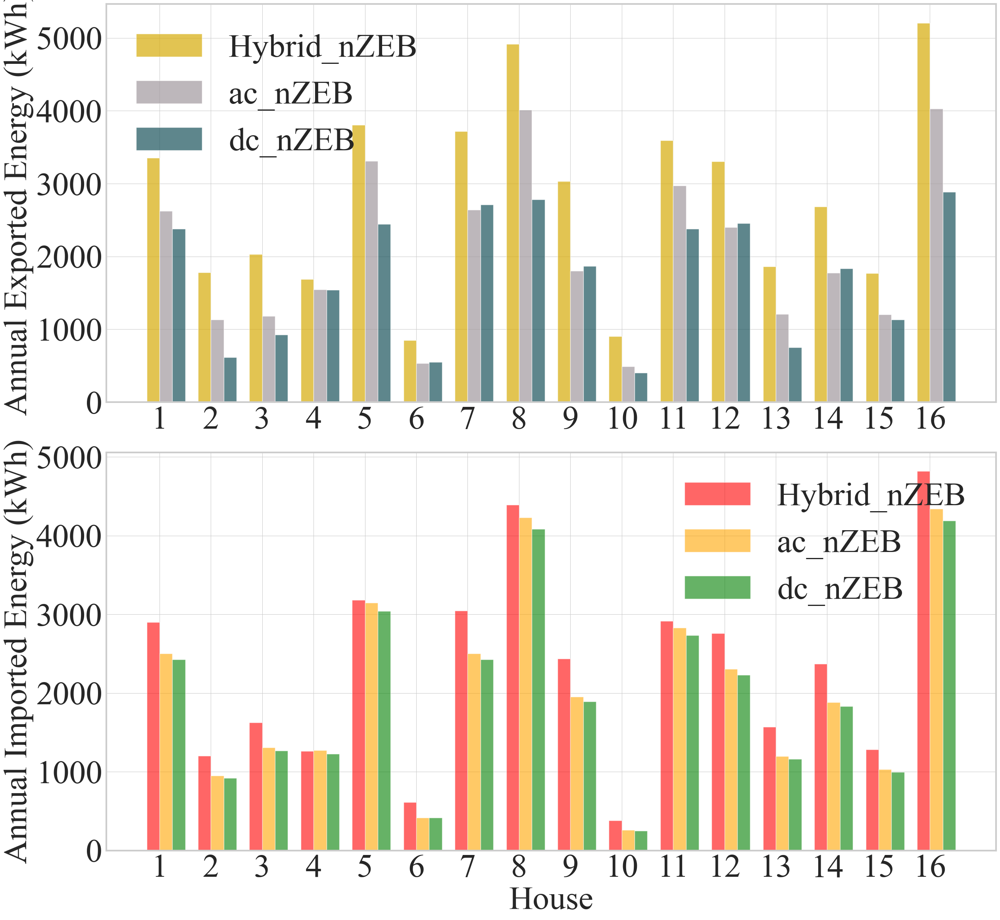

In [99]:
# plt.figure(figsize=(20, 20)) 
# plt.plot([results_hb[f'h{house}']['Total ES energy loss']  for house in range(1,17)], '--', marker='o', label=f'hb_{house}')
# # plt.plot([results_hb[f'h{house}']['Total electricity consumption normal']  for house in range(1,17)], '--', marker='o', label=f'norm_{house}')
# plt.plot([results_ac[f'h{house}']['Total ES energy loss']  for house in range(1,17)],marker='h', label=f'ac_{house}')
# plt.plot([results_dc[f'h{house}']['Total ES energy loss']  for house in range(1,17)], ':' , marker='p', label=f'dc_{house}')
# 
# plt.legend(ncol=8, fontsize=20, frameon=False)
# plt.show()

threshold_hb = [-100,180,240,0,85,0,0,150,320,220,150,0,5,0,100,0]
threshold_dc = [-280,-550,-300,0,-850,0,0,-1250,0,-100,-600,0,-500,0,-100,-1200]

plt.figure(figsize=(30, 25))
# fig, (ax1, ax2) = plt.subplots((2,1), figsize=(30, 25))
num_houses = 16
bar_width = 0.25 
indices = np.arange(num_houses)
plt.subplot(211)
plt.bar(indices - 0.5 * bar_width, [results_hb[f'h{house}']['Total Energy Export to Grid']  + threshold_hb[house-1] for house in range(1, 17)], width=bar_width, label='Hybrid_nZEB', alpha=0.7, color='#d7ab09')
plt.bar(indices + 0.5 * bar_width, [results_ac[f'h{house}']['Total Energy Export to Grid'] for house in range(1, 17)], width=bar_width, label='ac_nZEB', alpha=0.7, color= '#a2999e')
plt.bar(indices + 1.5 * bar_width, [results_dc[f'h{house}']['Total Energy Export to Grid'] + threshold_dc[house-1] for house in range(1, 17)], width=bar_width, label='dc_nZEB', alpha=0.7 , color='#1a535c')

plt.xticks(indices, [f'{i}' for i in range(1, 17)])
plt.legend(fontsize=40, frameon=False)
ax = plt.gca()  
ax.spines['bottom'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['top'].set_linewidth(3)
ax.spines['right'].set_linewidth(3)
# plt.xlabel('House')
plt.ylabel('Annual Exported Energy (kWh)')

plt.subplot(212)
plt.bar(indices - 0.5 * bar_width, [results_hb[f'h{house}']['Total Energy Import with Grid'] for house in range(1, 17)], width=bar_width, label='Hybrid_nZEB', alpha=0.6, color='red')
plt.bar(indices + 0.5 * bar_width, [results_dc[f'h{house}']['Total Energy Import with Grid'] for house in range(1, 17)], width=bar_width, label='ac_nZEB', alpha=0.6 , color='orange')
plt.bar(indices + 1.5 * bar_width, [results_ac[f'h{house}']['Total Energy Import with Grid'] for house in range(1, 17)], width=bar_width, label='dc_nZEB', alpha=0.6, color= 'green')

plt.xticks(indices, [f'{i}' for i in range(1, 17)])
plt.legend(fontsize=40, frameon=False)
ax = plt.gca()  
ax.spines['bottom'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['top'].set_linewidth(3)
ax.spines['right'].set_linewidth(3)
plt.xlabel('House')
plt.ylabel('Annual Imported Energy (kWh)')

plt.tight_layout()
plt.savefig('annual_energy trade hybrid and dc.svg', dpi=500)
plt.show()

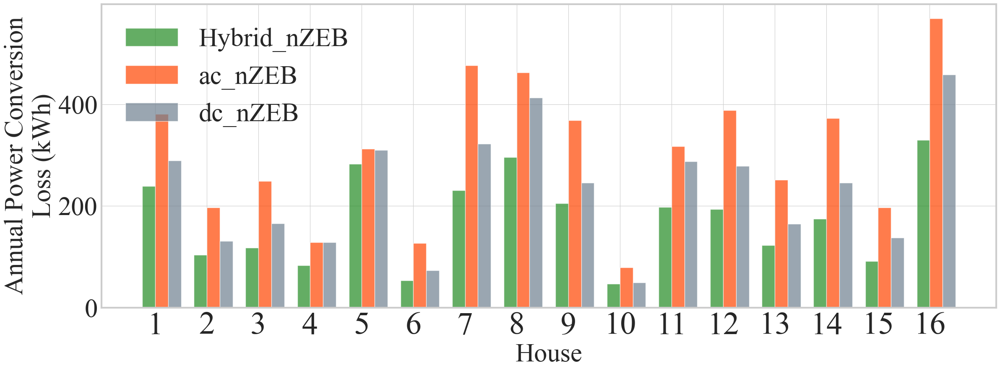

In [121]:
threshold = [40,10,0,0,85,0,0,25,32,10,10,0,5,0,-5,20]
plt.figure(figsize=(30, 10))

num_houses = 16
bar_width = 0.25 
indices = np.arange(num_houses)

plt.bar(indices - 0.5 * bar_width, [results_hb[f'h{house}']['Total Energy Loss Between ac dc Bus']  + results_hb[f'h{house}']['Total ES energy loss'] + threshold[house-1] for house in range(1, 17)], width=bar_width, label='Hybrid_nZEB', alpha=0.7, color='forestgreen')
plt.bar(indices + 0.5 * bar_width, [results_ac[f'h{house}']['Total ES energy loss']  +  results_ac[f'h{house}']['Total PV energy loss']  for house in range(1, 17)], width=bar_width, label='ac_nZEB', alpha=0.7, color= 'orangered')
plt.bar(indices + 1.5 * bar_width, [results_dc[f'h{house}']['Total Energy Exchange Loss'] + results_dc[f'h{house}']['Total ES energy loss']  for house in range(1, 17)], width=bar_width, label='dc_nZEB', alpha=0.7 , color='slategrey')

plt.xticks(indices, [f'{i}' for i in range(1, 17)])
plt.legend(fontsize=40, frameon=False)
ax = plt.gca()  
ax.spines['bottom'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['top'].set_linewidth(3)
ax.spines['right'].set_linewidth(3)
plt.xlabel('House')
plt.ylabel('Annual Power Conversion Loss(kWh)')
plt.savefig('annual_energy loss hybrid and dc.svg', dpi=500)
plt.show()

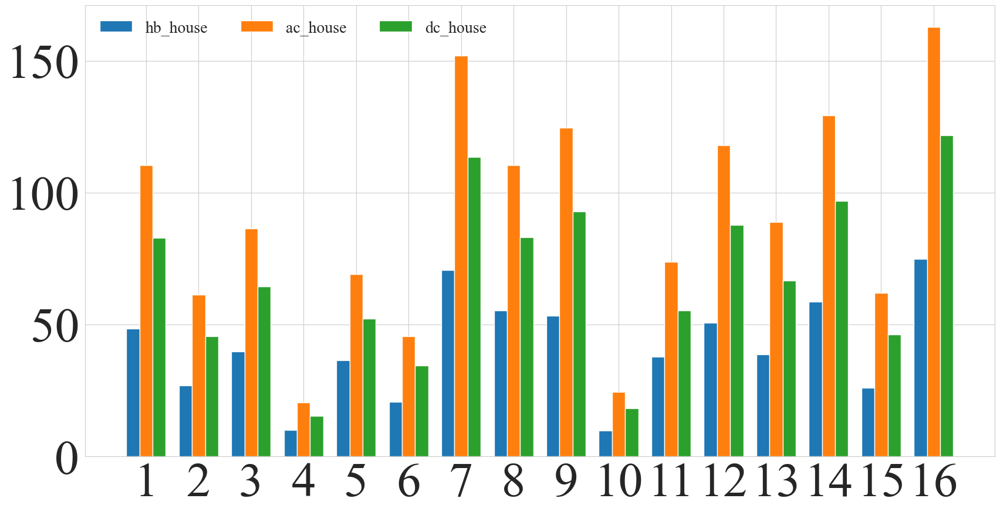

In [137]:
plt.figure(figsize=(20, 20))
num_houses = 16
bar_width = 0.25
indices = np.arange(num_houses)

plt.bar(indices, [results_hb[f'h{house}']['Total ES energy loss'] for house in range(1, 17)], width=bar_width, label='hb_house')
# plt.bar(indices + bar_width, [results_ac[f'h{house}']['Total ES energy loss'] for house in range(1, 17)], width=bar_width, label='ac_house')
# plt.bar(indices + 2 * bar_width, [results_dc[f'h{house}']['Total ES energy loss'] for house in range(1, 17)], width=bar_width, label='dc_house')

plt.xticks(indices + bar_width, [f'{i}' for i in range(1, 17)])
plt.legend(ncol=8, fontsize=20, frameon=False)
plt.show()

In [155]:
plt.figure(figsize=(20, 20))
es_cap = [*range(1,41)]
for house in range(1, 17): 
    plt.plot(es_cap,[results_dc[f'h{house},es{ess_cap}']['Total Energy Exchanged with Grid'] for ess_cap in es_cap],'--', marker='o', label=f'dc_{house}')
    plt.plot(es_cap,[results_ac[f'h{house},es{ess_cap}']['Total Energy Exchanged with Grid'] for ess_cap in es_cap] , marker='x', label=f'ac_{house}')
plt.legend(ncol=5, fontsize=25, frameon=False )
ax = plt.gca()  
ax.spines['bottom'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['top'].set_linewidth(3)
ax.spines['right'].set_linewidth(3)
plt.xlabel('ESS Capacity (kWh)')
plt.ylabel('Annual Energy Exchanged (kWh)')
# plt.savefig('Energy Exchanged vs ES size ac dc.svg', dpi=500)
plt.show()

dict_keys(['h1', 'h2', 'h3', 'h4', 'h5', 'h6', 'h7', 'h8', 'h9', 'h10', 'h11', 'h12', 'h13', 'h14', 'h15', 'h16'])


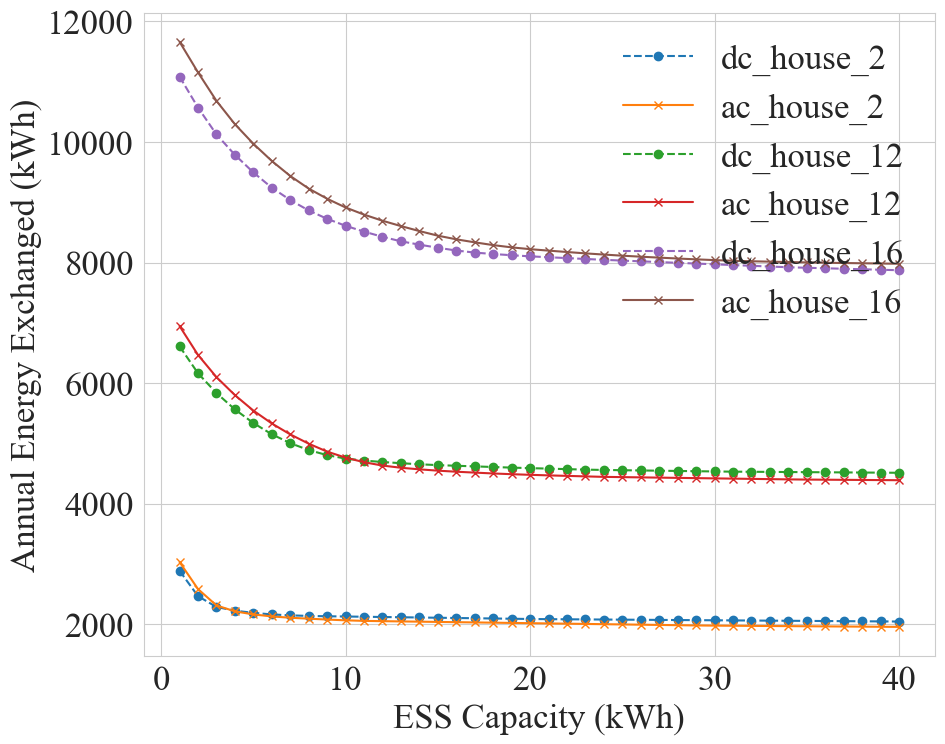

In [183]:
plt.figure(figsize=(20, 20))
es_cap = [*range(1,41)]
for house in range(1, 17): 
    plt.plot(es_cap, [results_dc[f'h{house},es{ess_cap}']['ESC']  for ess_cap in es_cap],'--', marker='o', label=f'dc_{house}')
    plt.plot(es_cap, [results_dc[f'h{house},es{ess_cap}']['ESC'] for ess_cap in es_cap] ,marker='x', label=f'ac_{house}')
plt.legend(ncol=5, fontsize=25, frameon=False )
ax = plt.gca()  
ax.spines['bottom'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['top'].set_linewidth(3)
ax.spines['right'].set_linewidth(3)
plt.xlabel('ESS Capacity (kWh)')
plt.ylabel('Self Sufficiency (%)')
# plt.savefig('Esc vs ES size ac dc.svg', dpi=500)
plt.show()

In [ ]:
converter_esopt =  pd.DataFrame()
converter_esopt['1'] = df['TEE_1,20']
converter_esopt['2'] = df['TEE_2,11']
converter_esopt['3'] = df['TEE_3,15']
converter_esopt['4'] = df['TEE_4,4']
converter_esopt['5'] = df['TEE_5,17']
converter_esopt['6'] = df['TEE_6,8']
converter_esopt['7'] = df['TEE_7,13']
converter_esopt['8'] = df['TEE_8,16']
converter_esopt['9'] = df['TEE_9,12']
converter_esopt['10'] = df['TEE_10,5']
converter_esopt['11'] = df['TEE_11,13']
converter_esopt['12'] = df['TEE_12,12']
converter_esopt['13'] = df['TEE_13,10']
converter_esopt['14'] = df['TEE_14,12']
converter_esopt['15'] = df['TEE_15,8']
converter_esopt['16'] = df['TEE_16,20']

def categorize_values(val, max_val):
    if val <= max_val * 0.25:
        return '0-25%'
    elif val <= max_val * 0.50:
        return '25-50%'
    elif val <= max_val * 0.75:
        return '50-75%'
    else:
        return '75-100%'

bar_data = {}
for col in converter_esopt.columns:
    max_val = converter_esopt[col].max()
    categories = converter_esopt[col].apply(lambda x: categorize_values(x, max_val))
    bar_data[col] = categories.value_counts(normalize=True)  # normalize to get proportions

bar_width = 0.5
r = np.arange(len(converter_esopt.columns))

fig, ax = plt.subplots(figsize=(20, 6))
colors = {'0-25%': 'red', '25-50%': 'orange', '50-75%': 'green', '75-100%': 'blue'}

bottoms = np.zeros(len(converter_esopt.columns))
for section,color in colors.items():
    values = [bar_data[col][section] if section in bar_data[col] else 0 for col in converter_esopt.columns]
    ax.bar(r, values, bottom=bottoms, edgecolor='white', width=bar_width, label=section, color=color, alpha=0.6)
    bottoms += np.array(values)
ax.set_ylim([0,1.3])
ax.set_xlabel('House code', fontsize=30)
ax.set_xticks(r)
ax.set_xticklabels(converter_esopt.columns, rotation=90)
ax.set_ylabel('Normalized Capacity', fontsize=30)
ax.legend(fontsize=20, frameon=False, ncol=4, loc='best')
ax=plt.gca()
ax.spines['bottom'].set_linewidth(3)  
ax.spines['left'].set_linewidth(3) 
ax.spines['top'].set_linewidth(3)
ax.spines['right'].set_linewidth(3)
plt.tight_layout()
# plt.savefig('operation_area.svg', dpi =500)
plt.show()

In [150]:
for col in converter_esopt.columns:    
    for group in range(1, 11):
        threshold = group * 0.10 * converter_esopt[col].max()
        group_name = f'{group}'
        converter_esopt.loc[converter_esopt[col] <= threshold, f'Cat_{col}'] = group_name

    converter_esopt[f'{col}_dc_Efficiency'] = converter_esopt[f'Cat_{col}'].apply(lambda x: iso_ac_dc[int(x)-1])
    # converter_esopt[f'{col}_dc_Efficiency'] = converter_esopt[f'Cat_{col}'].apply(lambda x: iso_dc_dc[int(x)-1])
    conv_losses[f'iso_dc_nZEB_{col}'] = converter_esopt[col] * (1 - converter_esopt[f'{col}_dc_Efficiency'] / 100)
# conv_losses[f'pv_dc_nZEB_{house}'] = df['Generation'] * (1 - df['dc_Efficiency'] / 100)

NameError: name 'h1' is not defined

In [ ]:
iso_ac_dc_loss = [conv_losses[f'iso_dc_nZEB_{i+1}'].sum() for i in range(num_houses)]
# dc_losses = [conv_losses[f'pv_dc_nZEB_{i+1}'].sum() for i in range(num_houses)]

x = np.arange(num_houses)  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=(30, 15))
rects1 = ax.bar(x - width/3, iso_ac_dc_loss, width/4, label='Isolated bidirectional ac/dc converter', alpha=0.5, color= 'blue')
rects2 = ax.bar(x , ac_losses, width/4, label='PV power converter connected to ac bus', alpha=0.5, color= 'red')
rects3 = ax.bar(x + width/3, dc_losses, width/4, label='PV power converter connected to dc bus',  alpha=0.5, color= 'green')


ax.set_ylabel('Annual energy loss (kWh)', fontsize=50)
ax.set_xlabel('House', fontsize=50)
ax.set_xticks(x)

ax.set_xticklabels([f'{i+1}' for i in range(num_houses)])
ax.legend(frameon =False)

# def autolabel(rects):
#     for rect in rects:
#         height = rect.get_height()
#         ax.annotate('{}'.format(round(height, 2)),
#                     xy=(rect.get_x() + rect.get_width() / 2, height),
#                     xytext=(0, 3),  # 3 points vertical offset
#                     textcoords="offset points",
#                     ha='center', va='bottom')
# 
# autolabel(rects1)
# autolabel(rects2)

ax = plt.gca()  
ax.spines['bottom'].set_linewidth(4)  
ax.spines['left'].set_linewidth(4) 
ax.spines['top'].set_linewidth(4)
ax.spines['right'].set_linewidth(4)
plt.tight_layout()
plt.savefig('conv_loss_comparison.svg', dpi=500)
plt.show()

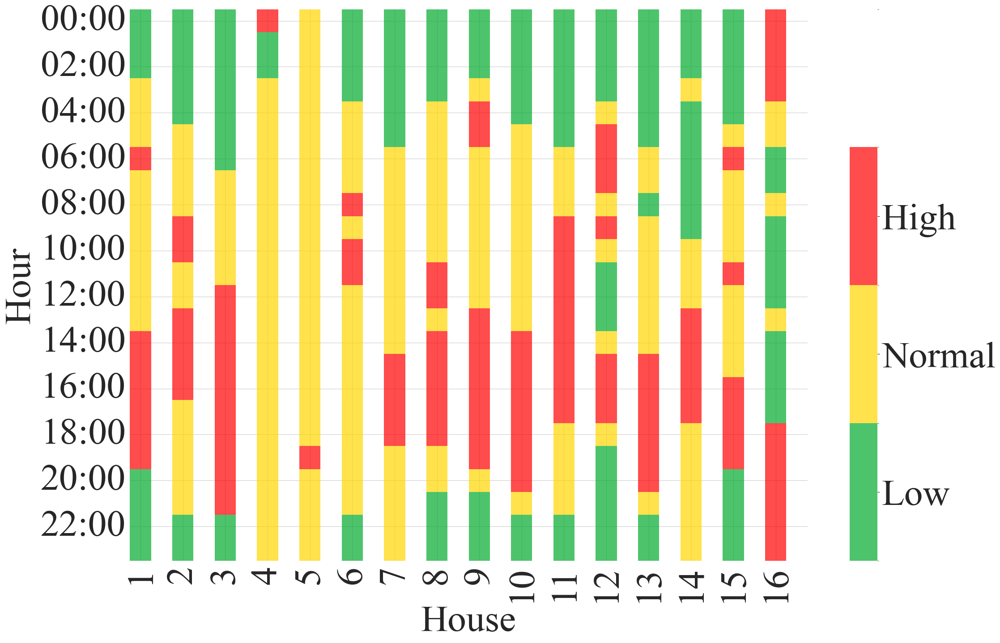

In [133]:
df_p = pd.read_excel("cpe_2024.xlsx")
df_p['h_16'] = df_p.h_16.shift(periods=-4, fill_value=0) 

from datetime import datetime, time, timedelta

def extract_time(value):
    if isinstance(value, time):
        return value
    elif isinstance(value, str):
        try:
            return datetime.strptime(value, '%H:%M:%S').time()
        except ValueError:
            return datetime.strptime(value, '%Y-%m-%d %H:%M:%S').time()

df_p['hour'] = df_p['hour'].apply(extract_time)
df_p['hour'] = pd.to_datetime(df_p['hour'], format='%H:%M:%S', errors='coerce').dt.time

first_none_index = df_p[df_p['hour'].isna()].index.min()
if first_none_index is not None and not pd.isna(first_none_index):
    last_time = df_p.loc[first_none_index - 1, 'hour'] if first_none_index > 0 else datetime.min.time()
    new_times = [(datetime.combine(datetime.today(), last_time) + timedelta(hours=i+1)).time() for i in range(len(df_p) - first_none_index)]
    df_p.loc[first_none_index:, 'hour'] = new_times
    
std_val=[]
mean_val=[]
tres1 = []
tres2 = []
tres3 = []
tres4 = []

df_grouped_mean = df_p.groupby('hour').mean()

for col in df_p.columns:
    if col.startswith('h_'):
        x=df_p[col].mean()
        mean_val.append(x)
        y=df_p[col].std()
        std_val.append(y)
        # tres1.append(x-0.3*y)
        tres1.append(x-0.15*y)
        tres2.append(x+0.15*y)
        # tres4.append(x+0.3*y)     
        
        
def cat_values(val, index):
    if val < tres1[index]:
        return 0
    elif val <= tres2[index]:
        return 1
    # elif val <= tres3[index]:
    #     return 3
    # elif val <= tres4[index]:
    #     return 4    
    else:
        return 2
    
bar_data = {}
index=0
for i,col in enumerate(df_grouped_mean.columns):
    if col.startswith('h_'):
        categories = df_grouped_mean[col].apply(lambda x: cat_values(x, index))
        df_grouped_mean[f'{i+1}_cat']=categories
        index +=1
        # bar_data[col] = categories.value_counts(normalize=True)  # normalize to get proportions
        
        
from matplotlib.colors import BoundaryNorm, ListedColormap

filtered_columns = [col for col in df_grouped_mean.columns if col.endswith('_cat')]

new_df = df_grouped_mean[filtered_columns].copy()
for col in reversed(filtered_columns):
    new_df.insert(loc=new_df.columns.get_loc(col) + 1, column=f'{col}_space', value=np.nan)
    
my_colors = ['#02ab2e', 'gold', 'red', 'white'] 
cmap = ListedColormap(my_colors)
bounds = [0, 1, 2, 3, 4] 
my_norm = BoundaryNorm(bounds, len(bounds) - 1)

plt.figure(figsize=(24, 16))  
ax = sns.heatmap(new_df, cmap=cmap, norm=my_norm,  alpha=0.7) 

colorbar = ax.collections[0].colorbar 
r = colorbar.vmax - colorbar.vmin 
colorbar.set_ticks([0.5, 1.5, 2.5]) 
colorbar.set_ticklabels(['Low', 'Normal', 'High'])  

start=0.5
step= 2
end= 31
xticks_set = [start + i * step for i in range(int((end - start) / step) + 1)]
plt.xticks(xticks_set, ['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16'])

end_y = 23.5
yticks_set = [start + i * step for i in range(int((end_y - start) / step) + 1)]
yticks_labels = [f'{int(y):02d}:00' for y in yticks_set] 
plt.yticks(yticks_set, yticks_labels)

plt.xlabel('House',fontsize=50)
plt.ylabel('Hour',fontsize=50)

plt.tight_layout()
# plt.savefig('consumption_pattern.svg', dpi=500)
plt.show()

In [ ]:
efficinecy_table= {
    'labels': [20, 40, 60, 80, 100],
    '[9],  DC bus voltage : 350V' : [97.9, 98.1, 98.4, 97.8, 97.6],
    '[11], DC bus voltage : 275V' : [94.8, 96.2, 96.4, 96, 95.5],
    '[11], DC bus voltage : 350V' : [94.2, 95, 95.6, 95.7, 95.6],
    '[12], DC bus voltage : 48V' : [95, 97, 97.4, 96.6, 96.4],
    '[13], DC bus voltage : 350V' : [94.1, 96.3, 96.7, 96.6, 96.5],
    '[14], DC bus voltage : 600V' : [94.1, 95, 95.3, 95.1, 94.2],
}
efficiency_curve= pd.DataFrame(efficinecy_table)


colors = ['#6B6F9E', '#377eb8', '#FF8427', '#70ABAF', '#A30026', '#688e26']
markers = ['o', 's', '^', 'D', 'p', 'h']
plt.figure(figsize=(20, 14))
for i, column in enumerate(efficiency_curve.columns[1:]):
    sns.lineplot(x=efficiency_curve['labels'], y=efficiency_curve[column], marker=markers[i],markersize=20 ,label=column, color=colors[i], linewidth=3.5)
plt.xlabel('Output power (%)')
plt.xticks([20,40,60,80,100])
plt.ylabel('Efficiency (%)')
plt.ylim([90,100])
plt.grid(True)
ax = plt.gca()  
ax.spines['bottom'].set_linewidth(2)  
ax.spines['left'].set_linewidth(2) 
ax.spines['top'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)
plt.legend(frameon=False, fontsize=30)
# plt.savefig('Efficiency_curves.svg', dpi =500)
plt.show()